# Initializing the dataset and classes

In [1]:
!pip install roboflow ultralytics matplotlib opencv-python albumentations==0.4.6 --quiet

import os
import shutil
from collections import Counter, defaultdict

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from albumentations.augmentations.bbox_utils import normalize_bboxes, denormalize_bboxes

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import yaml
from roboflow import Roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 7.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.7/877.7 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.2 MB/s eta 0:00:00


In [2]:
rf = Roboflow(api_key="eGsEbW5nGpFjTU1Ml5Th")
project = rf.workspace("roboflow-gw7yv").project("website-screenshots")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Website-Screenshots-1 in yolov8:: 100%|██████████| 4836/4836 [00:02<00:00, 2252.08it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
# Esempio di utilizzo
image_dir = '/content/Website-Screenshots-1/train/images'  # Cartella con le immagini
label_dir = '/content/Website-Screenshots-1/train/labels'  # Cartella con i file di etichette

with open('/content/Website-Screenshots-1/data.yaml', 'r') as f:
    data_yaml = yaml.safe_load(f)

class_names = data_yaml['names']

In [4]:
# Define the paths to the original folders and the new cloned folders
base_path = '/content/Website-Screenshots-1'  # Change this to your dataset's root directory
folders_to_clone = ['train', 'test', 'valid']

# Clone each folder
for folder in folders_to_clone:
    original_folder = os.path.join(base_path, folder)
    cloned_folder = os.path.join(base_path, f"{folder}_model")

    # Create the clone folder if it doesn't exist
    if not os.path.exists(cloned_folder):
        os.makedirs(cloned_folder)

    # Copy all files and subdirectories to the clone
    for item in os.listdir(original_folder):
        source = os.path.join(original_folder, item)
        destination = os.path.join(cloned_folder, item)
        if os.path.isdir(source):
            shutil.copytree(source, destination)
        else:
            shutil.copy2(source, destination)

print("Cloning complete: created train_model, test_model, and valid_model folders with all files.")


Cloning complete: created train_model, test_model, and valid_model folders with all files.


# Stats

In [5]:
def get_class_name(class_idx):
    """
    Restituisce il nome della classe dato il suo indice, garantito dal dataset.
    """
    if 0 <= class_idx < len(class_names):
        return class_names[class_idx]
    else:
        return "Classe non valida"

# Esempio di lista di indici di classi
class_indices = [0, 1, 2, 3, 4, 5, 6, 7]  # Puoi cambiare questa lista con gli indici di classi che desideri

# Itera sugli indici di classe
for idx in class_indices:
    class_name = get_class_name(idx)  # Usa la funzione per ottenere il nome della classe
    print(f"Class {idx} corresponds to : {class_name}")


Class 0 corresponds to : button
Class 1 corresponds to : field
Class 2 corresponds to : heading
Class 3 corresponds to : iframe
Class 4 corresponds to : image
Class 5 corresponds to : label
Class 6 corresponds to : link
Class 7 corresponds to : text


In [6]:
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')])
label_files = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])

# Print a few samples
print(f"Number of images: {len(image_files)}")
print(f"Number of labels: {len(label_files)}")


Number of images: 1688
Number of labels: 1688


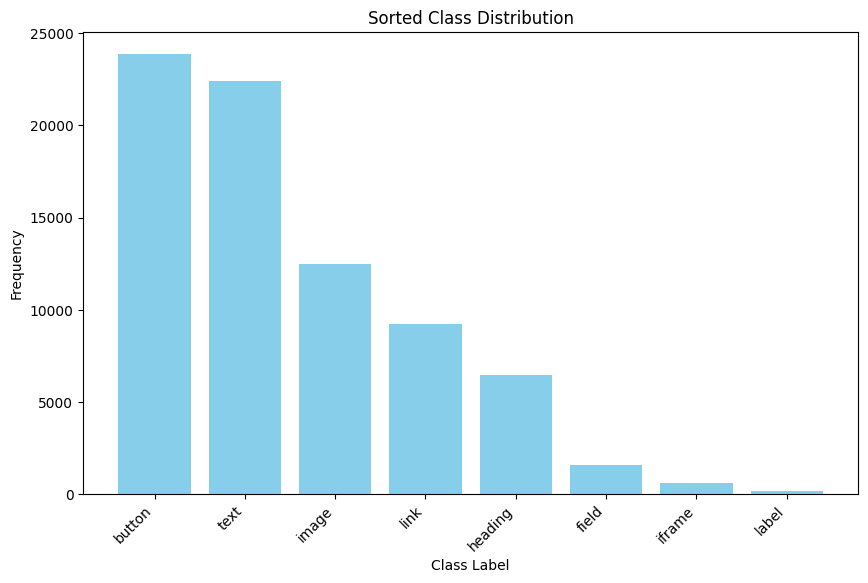

In [7]:
def count_class_distribution(label_path, class_names):
    class_counts = Counter()

    # Iterate over label files and count each class occurrence
    label_files = sorted([f for f in os.listdir(label_path) if f.endswith('.txt')])

    for label_file in label_files:
        with open(os.path.join(label_path, label_file), 'r') as f:
            annotations = f.readlines()
            for annot in annotations:
                class_idx = int(annot.split()[0])  # Get the class index
                class_counts[class_idx] += 1  # Increment the count for this class

    # Convert class indices to class names
    sorted_class_counts = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
    sorted_class_names = [class_names[i] for i, _ in sorted_class_counts]
    sorted_counts = [count for _, count in sorted_class_counts]

    return sorted_class_names, sorted_counts

# Path to label files
label_path = '/content/Website-Screenshots-1/train/labels'

# Get the sorted class distribution
sorted_class_names, sorted_counts = count_class_distribution(label_path, class_names)

# Plot the sorted class distribution
plt.figure(figsize=(10, 6))
plt.bar(sorted_class_names, sorted_counts, color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.title('Sorted Class Distribution')
plt.xlabel('Class Label')
plt.ylabel('Frequency')
plt.show()

FIRST VISUALIZZATION OF IMAGES WITH BOXES

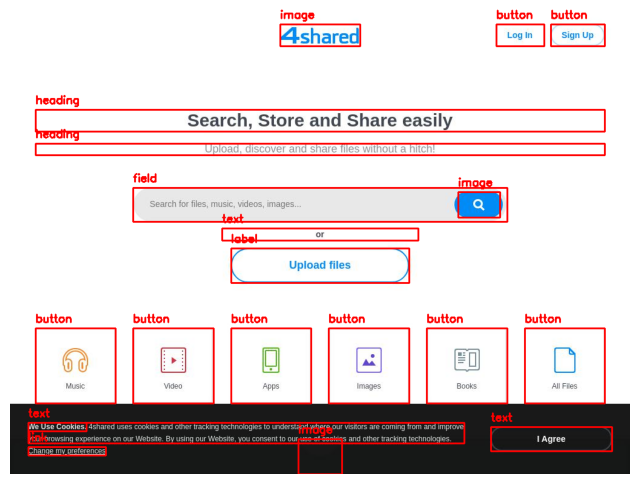

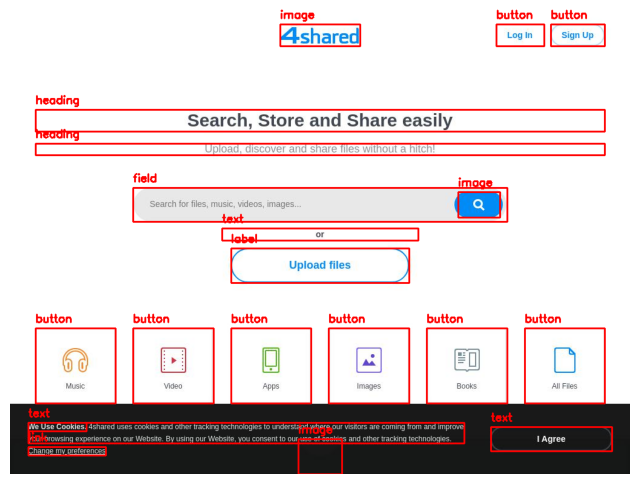

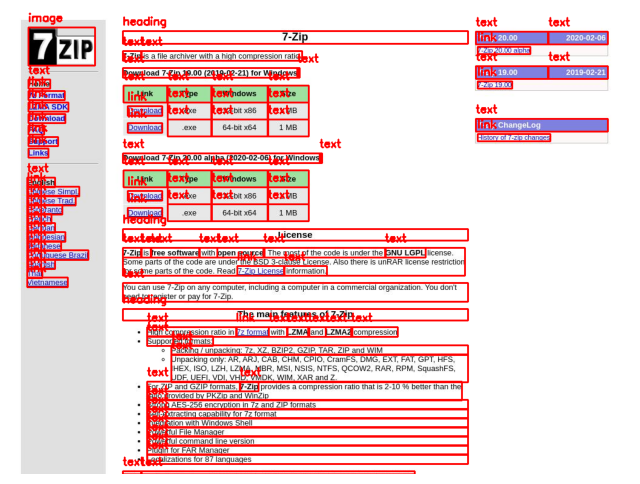

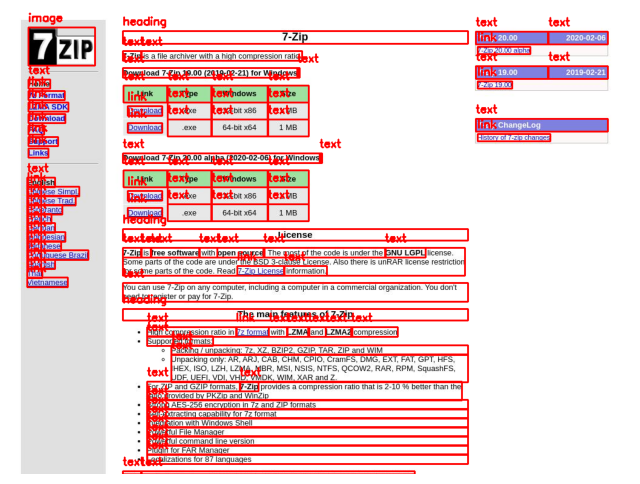

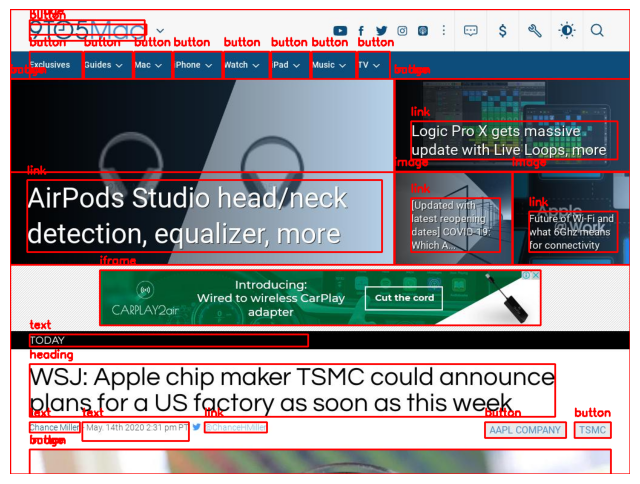

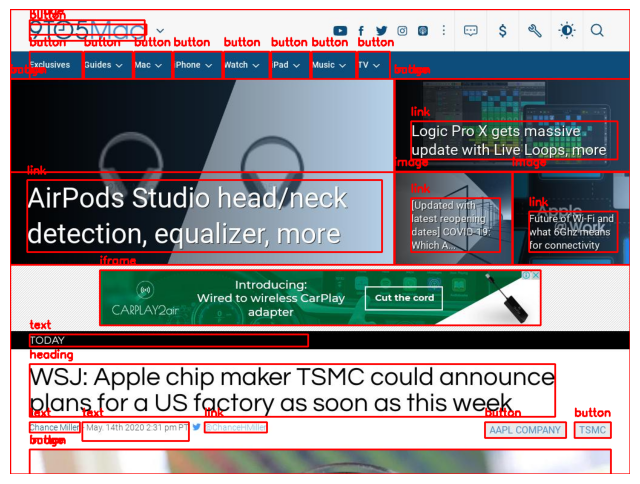

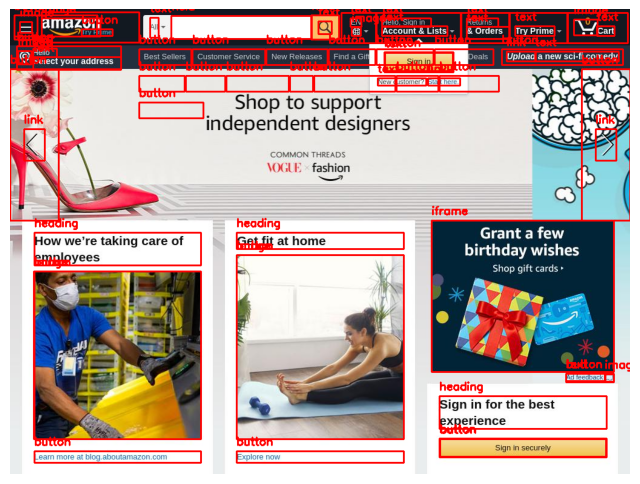

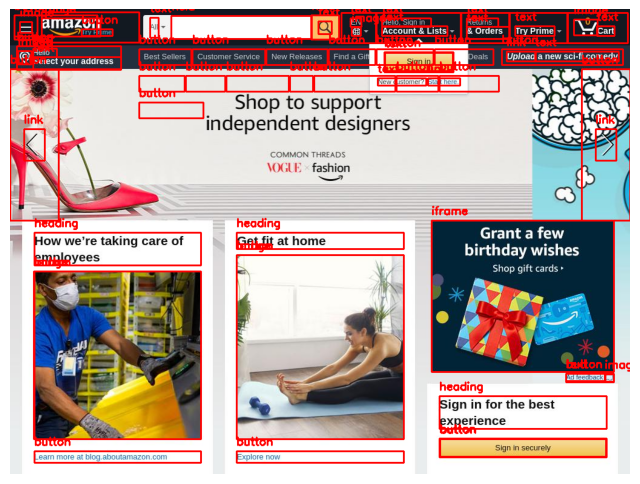

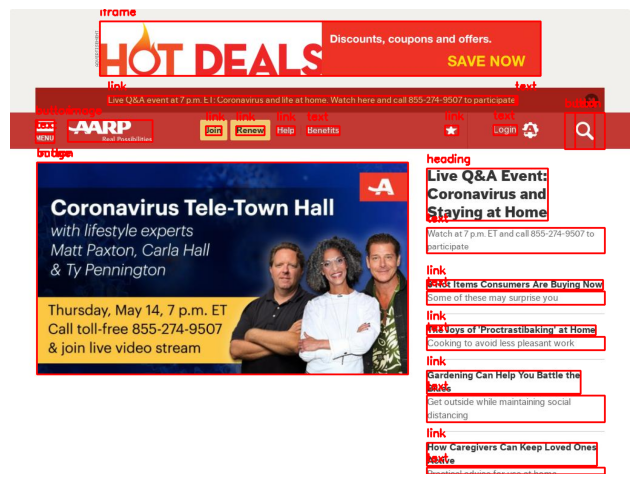

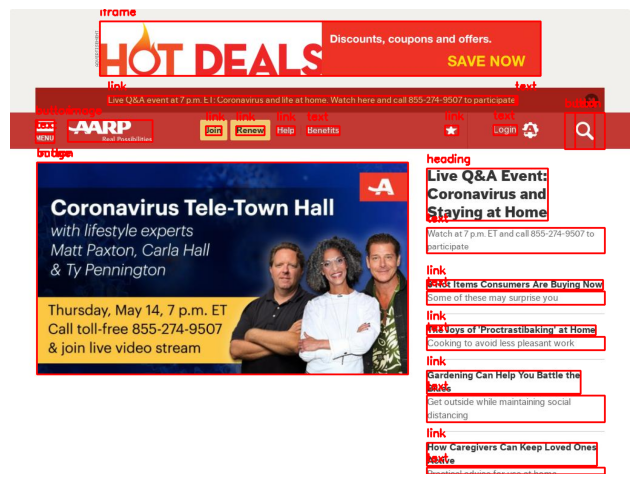

In [8]:
def plot_image_with_bboxes(image_path, label_path):
    # Leggi l'immagine
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Leggi le annotazioni
    h, w, _ = img.shape
    with open(label_path, 'r') as f:
        annotations = f.readlines()

    # Disegna le bounding boxes
    for annotation in annotations:
        class_idx, x_center, y_center, bbox_width, bbox_height = map(float, annotation.strip().split())
        # Converti il formato YOLO in coordinate pixel
        x_center *= w
        y_center *= h
        bbox_width *= w
        bbox_height *= h
        x_min = int(x_center - bbox_width / 2)
        y_min = int(y_center - bbox_height / 2)
        x_max = int(x_center + bbox_width / 2)
        y_max = int(y_center + bbox_height / 2)

        # Disegna la bounding box sull'immagine
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        class_name = get_class_name(int(class_idx))
        cv2.putText(img, class_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    # Mostra l'immagine con le bounding boxes
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Visualizza alcune immagini con le bounding boxes
for i in range(0, 10):
    image_sample = os.path.join(image_dir, image_files[i])
    label_sample = os.path.join(label_dir, label_files[i])
    plot_image_with_bboxes(image_sample, label_sample)



First visualizzation of bounding boxes descriptive statistics without standardization

In [9]:
import os
import matplotlib.pyplot as plt
import cv2

# List to store image dimensions
image_dimensions = []

# Iterate through image files and get dimensions
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    img = cv2.imread(image_path)
    height, width, _ = img.shape
    image_dimensions.append((width, height))

# Create a DataFrame for analysis
dimensions_df = pd.DataFrame(image_dimensions, columns=['Width', 'Height'])

# Summary statistics
print(dimensions_df.describe())

        Width  Height
count  1688.0  1688.0
mean   1024.0   768.0
std       0.0     0.0
min    1024.0   768.0
25%    1024.0   768.0
50%    1024.0   768.0
75%    1024.0   768.0
max    1024.0   768.0


In [10]:
import os

bbox_area = []
bbox_classes = []
bbox_features = []



for label_file in label_files:
    with open(os.path.join(label_dir, label_file), 'r') as f:
        labels = f.readlines()
        for label in labels:
            parts = label.strip().split()
            if len(parts) == 5:
                class_idx = int(parts[0])
                x_center = float(parts[1])
                y_center = float(parts[2])
                width = float(parts[3])
                height = float(parts[4])
                area = width * height
                bbox_area.append(area)  # Aggiunge l'area alla lista
                bbox_classes.append(class_idx)
                bbox_features.append([x_center, y_center, width, height, area])


DESCRIPTIVE STATISTICS OF BOUNDING BOXES:

In [11]:
from collections import defaultdict
import os
import pandas as pd

def bounding_box_statistics(copy_label_dir):
    """
    Calculates the statistics of bounding boxes for each class and returns a summary.
    """
    bbox_stats = defaultdict(list)  # Stores statistics for each class
    label_files = sorted([f for f in os.listdir(copy_label_dir) if f.endswith('.txt')])

    for label_file in label_files:
        label_path = os.path.join(copy_label_dir, label_file)

        with open(label_path, 'r') as f:
            labels = f.readlines()

        for label in labels:
            class_idx, x_center, y_center, width, height = map(float, label.strip().split())
            bbox_area = width * height
            bbox_stats[class_idx].append(bbox_area)

    # Calculate statistics
    stats_summary = {
        class_idx: {
            'Count': len(areas),
            'Mean': sum(areas) / len(areas) if areas else 0,
            'Min': min(areas) if areas else 0,
            'Max': max(areas) if areas else 0
        }
        for class_idx, areas in sorted(bbox_stats.items())  # Sort by class index
    }

    # Convert the summary to a DataFrame for tabular display
    stats_df = pd.DataFrame(stats_summary).T
    stats_df.index.name = 'Class'
    return stats_df

# Run the statistics calculation
stats = bounding_box_statistics(label_dir)

# Display the statistics as a sorted table
print(stats)


         Count      Mean       Min       Max
Class                                       
0.0    23872.0  0.013997  0.000000  1.000000
1.0     1558.0  0.012491  0.000173  0.094917
2.0     6470.0  0.024574  0.000000  1.000000
3.0      608.0  0.122329  0.000000  1.000000
4.0    12486.0  0.042565  0.000000  1.000000
5.0      180.0  0.005063  0.000196  0.038387
6.0     9246.0  0.003966  0.000000  1.000000
7.0    22400.0  0.009658  0.000000  1.000000


In [12]:
print(f"Bounding boxes number: {len(bbox_area)}")

Bounding boxes number: 76820


DEEP STATISTICS:

In [13]:
import numpy as np

mean_area = np.mean(bbox_area)
median_area = np.median(bbox_area)
std_area = np.std(bbox_area)
min_area = np.min(bbox_area)
max_area = np.max(bbox_area)

print(f"Media: {mean_area}, Mediana: {median_area}, Deviazione Standard: {std_area}")
print(f"Minimo: {min_area}, Massimo: {max_area}")

Media: 0.017864873836947372, Mediana: 0.00359344482421875, Deviazione Standard: 0.06512317317471521
Minimo: 0.0, Massimo: 1.0


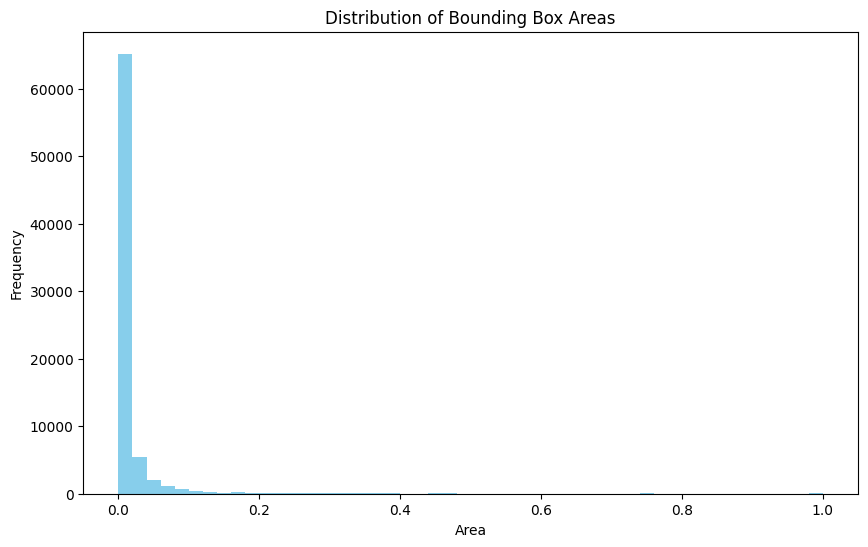

In [14]:
# Visualizzazione della distribuzione delle aree delle bounding boxes
plt.figure(figsize=(10, 6))
plt.hist(bbox_area, bins=50, color='skyblue')
plt.title("Distribution of Bounding Box Areas")
plt.xlabel("Area")
plt.ylabel("Frequency")
plt.show()

In [15]:
import os

bbox_area = []
bbox_classes = []
bbox_features = []



for label_file in label_files:
    with open(os.path.join(label_dir, label_file), 'r') as f:
        labels = f.readlines()
        for label in labels:
            parts = label.strip().split()
            if len(parts) == 5:
                class_idx = int(parts[0])
                x_center = float(parts[1])
                y_center = float(parts[2])
                width = float(parts[3])
                height = float(parts[4])
                area = width * height
                bbox_area.append(area)  # Aggiunge l'area alla lista
                bbox_classes.append(class_idx)
                bbox_features.append([x_center, y_center, width, height, area])


### *STATISTIC* TESTS:

SHAPIRO-WILK:
(Maximum size 5000 to have a consistent p-value)

In [16]:
import random
from scipy.stats import shapiro
# Assuming bbox_classes is populated as you process labels
class_counts = list(Counter(bbox_classes).values())

sample_size = 5000
bbox_area_sample = random.sample(bbox_area, sample_size)

stat, p_value = shapiro(bbox_area_sample)
print(f"P-value Shapiro-Wilk (campione di {sample_size}): {p_value}")


P-value Shapiro-Wilk (campione di 5000): 1.688660821832928e-89


GINI COEFFICIENT:
Interpretation:

An index close to 0 indicates equity in the distribution of classes, close to 1 indicates strong disparity.

In [17]:
def gini_coefficient(class_counts):
    total = sum(class_counts)
    sorted_counts = sorted(class_counts)
    cumulative_counts = np.cumsum(sorted_counts)
    gini_index = 1 - 2 * sum(cumulative_counts) / (total * len(class_counts)) + 1 / len(class_counts)
    return gini_index

gini_index = gini_coefficient(class_counts)
print(f"Indice di Gini: {gini_index}")


Indice di Gini: 0.5050182244207237


In [18]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Prepara i dati per t-SNE
# Utilizziamo la lista bbox_features che abbiamo popolato in precedenza
# Ogni elemento in bbox_features è [x_center, y_center, width, height, area]

# Converti bbox_features in un array numpy
bbox_features_array = np.array(bbox_features)

# Utilizziamo solo le coordinate delle bounding boxes per t-SNE (escludiamo l'area)
bbox_coords = bbox_features_array[:, :4]

# Etichette di classe corrispondenti
bbox_labels = np.array(bbox_classes)

# Poiché t-SNE è computazionalmente costoso su grandi dataset, campioniamo un sottoinsieme
sample_size = 5000
if len(bbox_coords) > sample_size:
    indices = np.random.choice(len(bbox_coords), size=sample_size, replace=False)
    bbox_coords_sample = bbox_coords[indices]
    bbox_labels_sample = bbox_labels[indices]
else:
    bbox_coords_sample = bbox_coords
    bbox_labels_sample = bbox_labels


In [19]:
# Esegui t-SNE
tsne = TSNE(n_components=2, random_state=42)
bbox_coords_tsne = tsne.fit_transform(bbox_coords_sample)


Interpretation of the graph:
Explanation:
We extracted the coordinates of bounding boxes and class labels.
We sampled 5000 bounding boxes to make the computation manageable.
We ran t-SNE to reduce the data to 2 dimensions.
We visualized the results of t-SNE, coloring each point according to its class label.
This visualization can help you understand how the bounding boxes of different classes are distributed and whether there are overlaps or clusters.
From the graph we see that some classes are much more frequent than others:
Button (buttons) and Text (text) are the most common classes, with a frequency exceeding 20,000 annotated objects.
Label and Iframe, on the other hand, are much less frequent in the dataset, with less than 1,000 annotations.
This indicates that the dataset is unbalanced, meaning that some classes are overrepresented compared to others. This is an important detail for training the model, as it may have difficulty learning correctly to recognize the less represented classes.
Utility of the graph:

The class distribution graph is useful for diagnosing imbalance problems in the dataset.
If some classes are underrepresented, it may be necessary to adopt data balancing techniques (such as oversampling minority classes or undersampling majority classes) to improve model performance.


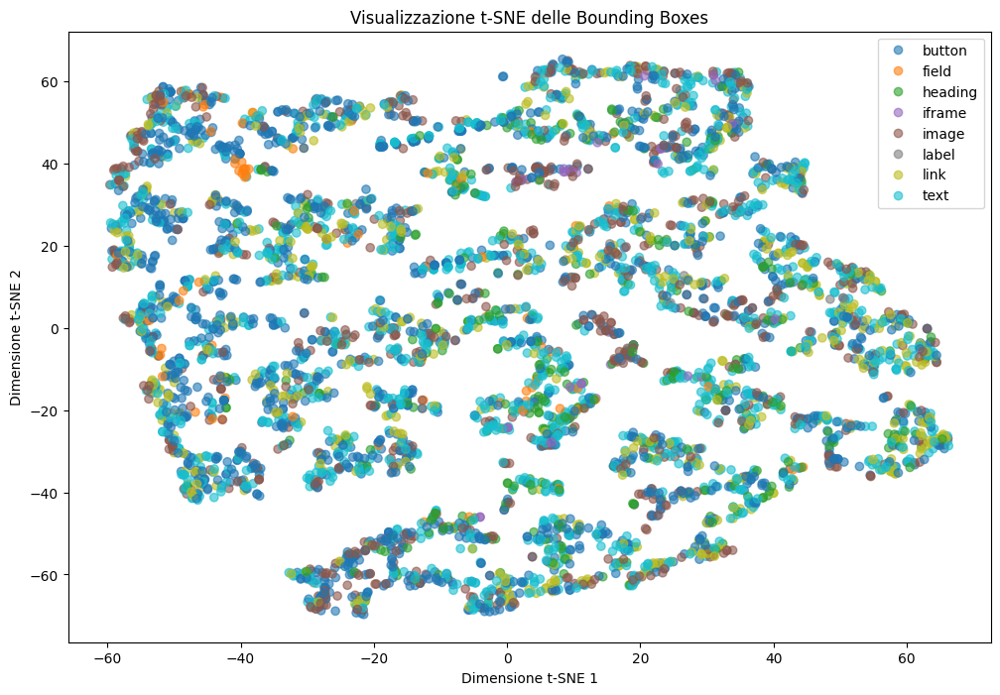

In [20]:
# Crea un grafico a dispersione dei risultati t-SNE
plt.figure(figsize=(12, 8))
scatter = plt.scatter(bbox_coords_tsne[:, 0], bbox_coords_tsne[:, 1], c=bbox_labels_sample, cmap='tab10', alpha=0.6)
plt.legend(handles=scatter.legend_elements()[0], labels=[get_class_name(i) for i in range(len(class_names))])
plt.title('Visualizzazione t-SNE delle Bounding Boxes')
plt.xlabel('Dimensione t-SNE 1')
plt.ylabel('Dimensione t-SNE 2')
plt.show()


# Data Cleaning

In [21]:
model_image_dir = '/content/Website-Screenshots-1/train_model/images'
model_label_dir = '/content/Website-Screenshots-1/train_model/labels'

In [22]:
# Load class labels from data.yaml
with open('/content/Website-Screenshots-1/data.yaml', 'r') as f:
    data_yaml = yaml.safe_load(f)
class_names = data_yaml['names']

 ## *Label Validation*

In [23]:
def validate_dataset_coordinates(labels_path):
    invalid_files = []
    for label_file in os.listdir(labels_path):
        with open(os.path.join(labels_path, label_file), 'r') as f:
            for line in f:
                class_idx, x_center, y_center, width, height = map(float, line.strip().split())
                if not all(0 < coord <= 1 for coord in [x_center, y_center, width, height]):
                    invalid_files.append(label_file)
                    break
    return invalid_files

invalid_labels = validate_dataset_coordinates(model_label_dir)
if invalid_labels:
    print(f"Found {len(invalid_labels)} files with invalid coordinates:")
    for file in invalid_labels[:10]:  # Print first 10 for brevity
        print(file)
    print("Consider cleaning or correcting these files before proceeding.")
else:
    print("All coordinates in the original dataset are valid.")

Found 234 files with invalid coordinates:
inkscape_org_png.rf.e082cb144b1e0e3bea66dabfe3da0bf2.txt
twitter_com_png.rf.H4qJjnKgvYW4xGO2RlII.txt
oreilly_com_png.rf.5cEqUWhsiJUudYt9u291.txt
loc_gov_png.rf.7c1bca1a872443c0f3ac44256f702435.txt
lego_com_png.rf.Zr5Nv8y75T9Mn5ZGvr76.txt
thrillist_com_png.rf.8AXo7KJqfxKHMMk9dsXg.txt
buymeacoffee_com_png.rf.b14d19aca61c026c7f6d8636e872a67a.txt
nbc_com_png.rf.qQpJKzZivgHbr7wM7PXn.txt
boeing_com_png.rf.kth9Q58WvRS3RIBaKTyO.txt
thenextweb_com_png.rf.cCuRzm3pHCbbzv0Iw7B5.txt
Consider cleaning or correcting these files before proceeding.


In [24]:
def clean_bounding_boxes_on_copy(copy_image_dir, copy_label_dir, min_threshold=0.001, max_threshold=0.9):
    """
    Filters bounding boxes that are too small or too large based on the thresholds.
    Deletes both the images and the corresponding label files if no valid bounding boxes remain,
    but works only on the copy directories.
    """
    cleaned_labels = 0
    total_labels = 0

    # Sort files to ensure matching
    image_files = sorted(os.listdir(copy_image_dir))
    label_files = sorted(os.listdir(copy_label_dir))

    for image_file, label_file in zip(image_files, label_files):
        image_path = os.path.join(copy_image_dir, image_file)
        label_path = os.path.join(copy_label_dir, label_file)

        # Check if the image and label file match
        image_base = os.path.splitext(image_file)[0]
        label_base = os.path.splitext(label_file)[0]

        if image_base != label_base:
            print(f"Warning: {image_file} and {label_file} do not match.")
            continue

        # Read the label file
        with open(label_path, 'r') as f:
            labels = f.readlines()

        new_labels = []
        for label in labels:
            total_labels += 1
            class_idx, x_center, y_center, width, height = map(float, label.strip().split())
            bbox_area = width * height

            # Filter based on the set thresholds
            if min_threshold <= bbox_area <= max_threshold:
                new_labels.append(label)
            else:
                cleaned_labels += 1

        # If there are no valid bounding boxes, delete both the image and the label file
        if len(new_labels) == 0:
            os.remove(image_path)
            os.remove(label_path)
            print(f"Deleted {image_file} and {label_file} due to lack of valid bounding boxes.")
        else:
            # Rewrite the label file only with valid bounding boxes
            with open(label_path, 'w') as f:
                for new_label in new_labels:
                    f.write(new_label)

    print(f"Total bounding boxes processed: {total_labels}")
    print(f"Bounding boxes removed: {cleaned_labels}")

# Run data cleaning on the copy directories
clean_bounding_boxes_on_copy(model_image_dir, model_label_dir, min_threshold=0.001, max_threshold=0.9)

Total bounding boxes processed: 76820
Bounding boxes removed: 15408


In [25]:
image_cnt = sorted([f for f in os.listdir(model_image_dir) if f.endswith('.jpg') or f.endswith('.png')])
label_cnt = sorted([f for f in os.listdir(model_label_dir) if f.endswith('.txt')])

print(f"Number of images: {len(image_cnt)}")
print(f"Number of labels: {len(label_cnt)}")

Number of images: 1688
Number of labels: 1688


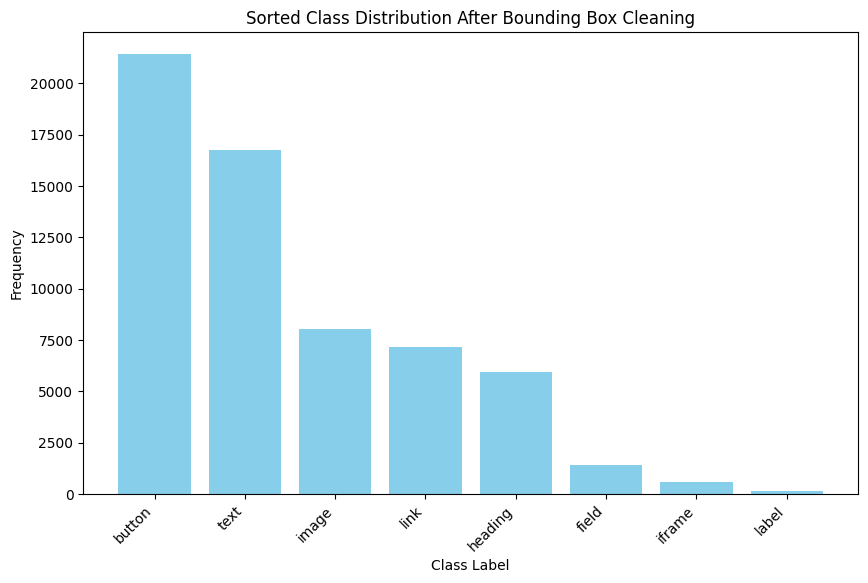

In [26]:
def count_class_distribution(label_path, class_names):
    class_counts = Counter()

    # Iterate over label files and count each class occurrence
    label_files = sorted([f for f in os.listdir(label_path) if f.endswith('.txt')])

    for label_file in label_files:
        with open(os.path.join(label_path, label_file), 'r') as f:
            annotations = f.readlines()
            for annot in annotations:
                class_idx = int(annot.split()[0])  # Get the class index
                class_counts[class_idx] += 1  # Increment the count for this class

    # Convert class indices to class names
    sorted_class_counts = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
    sorted_class_names = [class_names[i] for i, _ in sorted_class_counts]
    sorted_counts = [count for _, count in sorted_class_counts]

    return sorted_class_names, sorted_counts

# Path to label files
label_path = '/content/Website-Screenshots-1/train_model/labels'

# Get the sorted class distribution
sorted_class_names, sorted_counts = count_class_distribution(label_path, class_names)

# Plot the sorted class distribution
plt.figure(figsize=(10, 6))
plt.bar(sorted_class_names, sorted_counts, color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.title('Sorted Class Distribution After Bounding Box Cleaning')
plt.xlabel('Class Label')
plt.ylabel('Frequency')
plt.show()

## Under Sampling

In [27]:
import random
# Define classes to undersample (e.g., button, text, image)
high_freq_classes = ['button', 'text', 'image']  # Adjust based on your earlier analysis

# Define the undersampling ratio for each class
undersample_ratios = {
    'button': 0.5,  # Keep 50% of button instances
    'text': 0.6,    # Keep 60% of text instances
    'image': 0.7    # Keep 70% of image instances
}


# Function to undersample the high-represented classes
def undersample_labels(label_path, class_names, high_freq_classes, undersample_ratios):
    label_files = sorted([f for f in os.listdir(label_path) if f.endswith('.txt')])

    for label_file in label_files:
        label_full_path = os.path.join(label_path, label_file)

        with open(label_full_path, 'r') as f:
            annotations = f.readlines()

        updated_annotations = []

        for annot in annotations:
            class_idx, x_center, y_center, bbox_width, bbox_height = map(float, annot.split())
            class_name = class_names[int(class_idx)]

            # If it's a high-frequency class, apply undersampling
            if class_name in high_freq_classes:
                keep_probability = undersample_ratios[class_name]

                # Decide whether to keep this bounding box based on the probability
                if random.random() < keep_probability:
                    updated_annotations.append(annot)
            else:
                # If it's not a high-frequency class, keep it as is
                updated_annotations.append(annot)

        # Rewrite the label file with the updated annotations
        with open(label_full_path, 'w') as f:
            for annot in updated_annotations:
                f.write(annot)

        # Print some progress information
        print(f"Processed {label_file}: {len(updated_annotations)} remaining annotations after undersampling.")

# Call the undersample function on your dataset
undersample_labels('/content/Website-Screenshots-1/train_model/labels', class_names, high_freq_classes, undersample_ratios)


Processed 4shared_com_png.rf.56ESfdbTeqhYqGJTPaY7.txt: 10 remaining annotations after undersampling.
Processed 4shared_com_png.rf.7da0b596a12c1c1885dbdbc808d9c846.txt: 14 remaining annotations after undersampling.
Processed 7-zip_org_png.rf.Q8hW3vouJvjGyI2FLxuy.txt: 52 remaining annotations after undersampling.
Processed 7-zip_org_png.rf.a1e68d22bb88d429ee318e8c85c917f9.txt: 55 remaining annotations after undersampling.
Processed 9to5mac_com_png.rf.NcF4DV5kC6mqzV9v1jIZ.txt: 20 remaining annotations after undersampling.
Processed 9to5mac_com_png.rf.b280c437f46781de696d7057495c4bf9.txt: 21 remaining annotations after undersampling.
Processed a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6.txt: 27 remaining annotations after undersampling.
Processed a_co_png.rf.ylebNBaJK2rVV9zCeJsF.txt: 33 remaining annotations after undersampling.
Processed aarp_org_png.rf.08d458dd63a9db42109f55877c6ba82c.txt: 12 remaining annotations after undersampling.
Processed aarp_org_png.rf.HvDVKOvk9s8WAuj9v8qh.txt: 

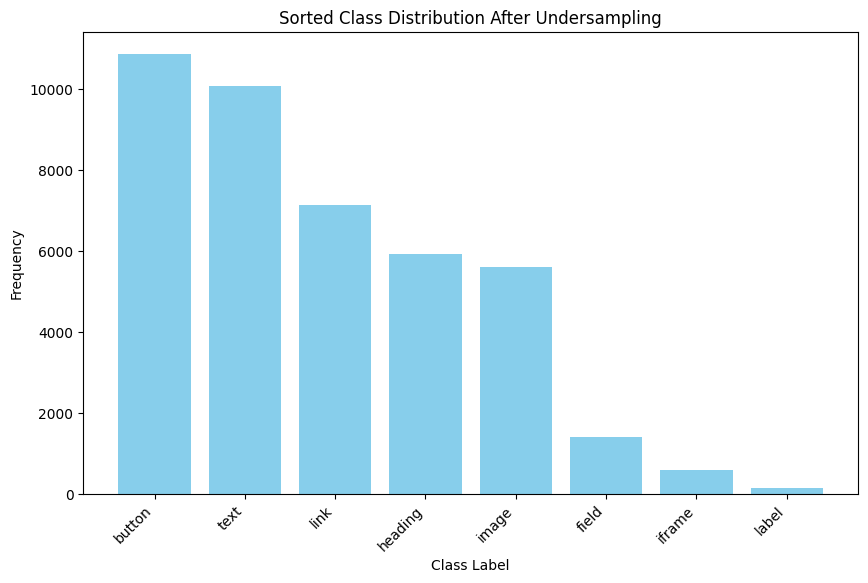

In [28]:
def count_class_distribution(label_path, class_names):
    class_counts = Counter()

    # Iterate over label files and count each class occurrence
    label_files = sorted([f for f in os.listdir(label_path) if f.endswith('.txt')])

    for label_file in label_files:
        with open(os.path.join(label_path, label_file), 'r') as f:
            annotations = f.readlines()
            for annot in annotations:
                class_idx = int(annot.split()[0])  # Get the class index
                class_counts[class_idx] += 1  # Increment the count for this class

    # Convert class indices to class names
    sorted_class_counts = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
    sorted_class_names = [class_names[i] for i, _ in sorted_class_counts]
    sorted_counts = [count for _, count in sorted_class_counts]

    return sorted_class_names, sorted_counts

# Path to label files
label_path = '/content/Website-Screenshots-1/train_model/labels'

# Get the sorted class distribution
sorted_class_names, sorted_counts = count_class_distribution(label_path, class_names)

# Plot the sorted class distribution
plt.figure(figsize=(10, 6))
plt.bar(sorted_class_names, sorted_counts, color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.title('Sorted Class Distribution After Undersampling')
plt.xlabel('Class Label')
plt.ylabel('Frequency')
plt.show()

##Data Augmentation

In [29]:
import yaml

# Path to the data.yaml file
yaml_path = '/content/Website-Screenshots-1/data.yaml'  # Update this path if necessary

# Load the YAML file
with open(yaml_path, 'r') as file:
    data_yaml = yaml.safe_load(file)

# Extract class names and enumerate their indexes
class_names = data_yaml.get('names', [])
class_index_mapping = {index: name for index, name in enumerate(class_names)}

# Display the class names with indexes
print("Class Index Mapping:")
for index, name in class_index_mapping.items():
    print(f"Index: {index}, Class: {name}")


Class Index Mapping:
Index: 0, Class: button
Index: 1, Class: field
Index: 2, Class: heading
Index: 3, Class: iframe
Index: 4, Class: image
Index: 5, Class: label
Index: 6, Class: link
Index: 7, Class: text


In [30]:
import os
import cv2
import random
import numpy as np
from PIL import Image, ImageEnhance

# Helper function to apply augmentations to an image
def augment_image(image):
    augmentations = [ImageEnhance.Color, ImageEnhance.Brightness, ImageEnhance.Contrast, ImageEnhance.Sharpness]
    # Apply random enhancement
    enhancer = random.choice(augmentations)
    factor = random.uniform(0.7, 1.3)  # Factor for augmentation
    image = enhancer(image).enhance(factor)

    # Optionally, add more augmentations like flipping, scaling, rotating, etc.
    if random.random() > 0.5:
        image = image.transpose(Image.FLIP_LEFT_RIGHT)
    return image

# Function to crop images around the bounding box of underrepresented classes
def crop_and_augment(images_path, labels_path, target_classes, min_size=(50, 50), augmentation_factor=5):
    augmented_count = 0
    for label_file in os.listdir(labels_path):
        label_path = os.path.join(labels_path, label_file)
        image_path = os.path.join(images_path, label_file.replace('.txt', '.jpg'))

        if not os.path.exists(image_path):
            continue

        # Read the image
        image = Image.open(image_path)
        image_w, image_h = image.size

        # Read the label file
        with open(label_path, 'r') as f:
            lines = f.readlines()

        for line in lines:
            class_idx, x_center, y_center, width, height = map(float, line.strip().split())
            class_idx = int(class_idx)

            if class_idx in target_classes:
                # Convert normalized coordinates back to absolute coordinates
                x_center_abs = x_center * image_w
                y_center_abs = y_center * image_h
                width_abs = width * image_w
                height_abs = height * image_h

                # Check if the bounding box is greater than the minimum size
                if width_abs > min_size[0] and height_abs > min_size[1]:
                    # Calculate the bounding box (xmin, ymin, xmax, ymax)
                    xmin = int(x_center_abs - width_abs / 2)
                    ymin = int(y_center_abs - height_abs / 2)
                    xmax = int(x_center_abs + width_abs / 2)
                    ymax = int(y_center_abs + height_abs / 2)

                    # Crop the image around the bounding box
                    cropped_image = image.crop((xmin, ymin, xmax, ymax))

                    # Apply augmentation to the cropped image multiple times
                    for i in range(augmentation_factor):
                        augmented_image = augment_image(cropped_image)

                        # Save the augmented image
                        new_image_name = label_file.replace('.txt', f'_aug_{i}.jpg')
                        new_image_path = os.path.join(images_path, new_image_name)
                        augmented_image.save(new_image_path)

                        # Adjust the label for the new augmented image
                        new_label_name = label_file.replace('.txt', f'_aug_{i}.txt')
                        new_label_path = os.path.join(labels_path, new_label_name)

                        # Since the image is cropped, the bounding box becomes the whole image (center = 0.5, 0.5 and width = 1, height = 1)
                        new_x_center, new_y_center, new_width, new_height = 0.5, 0.5, 1.0, 1.0

                        with open(new_label_path, 'w') as new_label_file:
                            new_label_file.write(f"{class_idx} {new_x_center} {new_y_center} {new_width} {new_height}\n")

                        augmented_count += 1

    print(f"Total augmented images: {augmented_count}")

# Define paths
dataset_path = '/content/Website-Screenshots-1'
train_images_path = os.path.join(dataset_path, 'train_model', 'images')
train_labels_path = os.path.join(dataset_path, 'train_model', 'labels')

# Define the target underrepresented classes (for example, classes with < 1000 occurrences)
underrepresented_classes = [1, 3, 5]  # Replace with actual class indices

# Perform cropping and augmentation
crop_and_augment(train_images_path, train_labels_path, underrepresented_classes, min_size=(100, 100), augmentation_factor=5)


Total augmented images: 1210


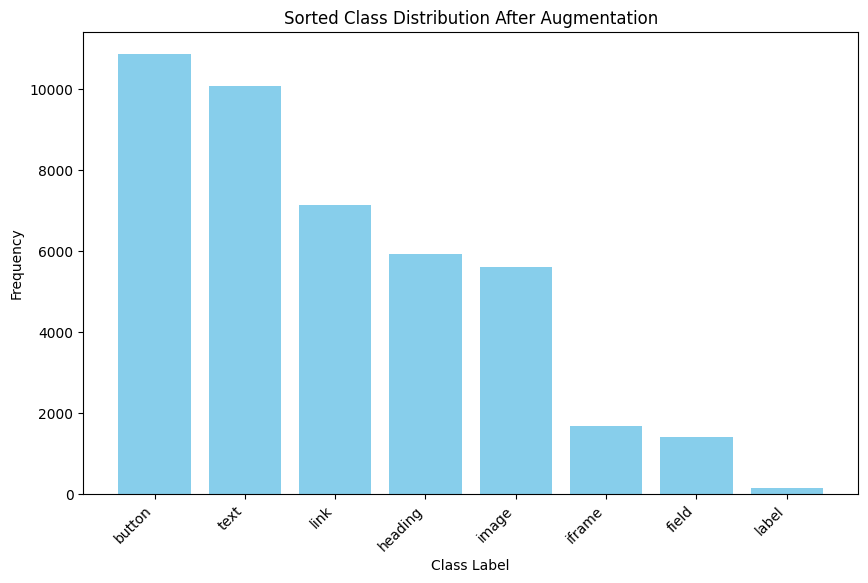

In [31]:
def count_class_distribution(label_path, class_names):
    class_counts = Counter()

    # Iterate over label files and count each class occurrence
    label_files = sorted([f for f in os.listdir(label_path) if f.endswith('.txt')])

    for label_file in label_files:
        with open(os.path.join(label_path, label_file), 'r') as f:
            annotations = f.readlines()
            for annot in annotations:
                class_idx = int(annot.split()[0])  # Get the class index
                class_counts[class_idx] += 1  # Increment the count for this class

    # Convert class indices to class names
    sorted_class_counts = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
    sorted_class_names = [class_names[i] for i, _ in sorted_class_counts]
    sorted_counts = [count for _, count in sorted_class_counts]

    return sorted_class_names, sorted_counts

# Path to label files
label_path = '/content/Website-Screenshots-1/train_model/labels'

# Get the sorted class distribution
sorted_class_names, sorted_counts = count_class_distribution(label_path, class_names)

# Plot the sorted class distribution
plt.figure(figsize=(10, 6))
plt.bar(sorted_class_names, sorted_counts, color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.title('Sorted Class Distribution After Augmentation')
plt.xlabel('Class Label')
plt.ylabel('Frequency')
plt.show()

In [32]:
image_cnt = sorted([f for f in os.listdir(model_image_dir) if f.endswith('.jpg') or f.endswith('.png')])
label_cnt = sorted([f for f in os.listdir(model_label_dir) if f.endswith('.txt')])

print(f"Number of images: {len(image_cnt)}")
print(f"Number of labels: {len(label_cnt)}")

Number of images: 2778
Number of labels: 2778


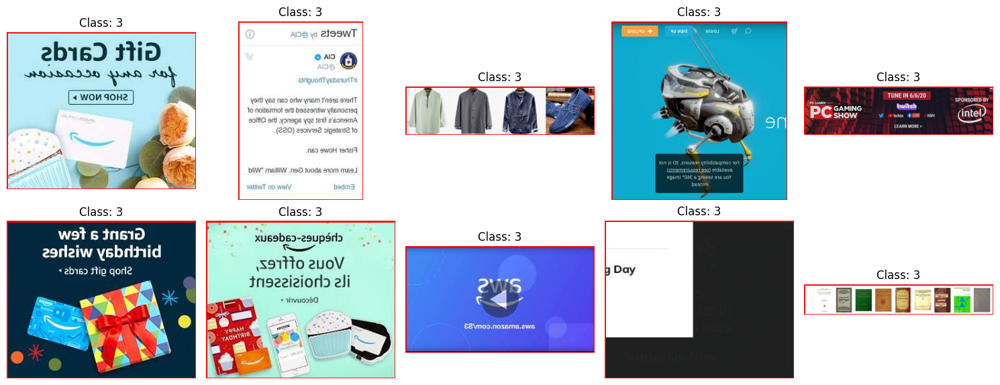

In [33]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def find_and_plot_augmented_images(images_path, labels_path, num_images=10):
    augmented_images = []

    # Traverse the directory and collect augmented image paths and corresponding label data
    for label_file in os.listdir(labels_path):
        if '_aug_' in label_file:
            image_file = label_file.replace('.txt', '.jpg')
            image_path = os.path.join(images_path, image_file)
            label_path = os.path.join(labels_path, label_file)

            if os.path.exists(image_path):
                # Open the image and label file
                image = Image.open(image_path)

                with open(label_path, 'r') as f:
                    line = f.readline().strip()
                    if line:
                        class_idx, x_center, y_center, width, height = map(float, line.split())
                        augmented_images.append((image, class_idx, x_center, y_center, width, height))

            # Stop after collecting the desired number of images
            if len(augmented_images) >= num_images:
                break

    # Plot the augmented images with bounding boxes
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    for idx, (image, class_idx, x_center, y_center, width, height) in enumerate(augmented_images[:num_images]):
        row, col = divmod(idx, 5)
        ax = axes[row, col]
        ax.imshow(image)

        # Calculate absolute bounding box coordinates
        image_w, image_h = image.size
        bbox_xmin = int((x_center - width / 2) * image_w)
        bbox_ymin = int((y_center - height / 2) * image_h)
        bbox_xmax = int((x_center + width / 2) * image_w)
        bbox_ymax = int((y_center + height / 2) * image_h)

        # Draw the bounding box
        bbox = patches.Rectangle((bbox_xmin, bbox_ymin), bbox_xmax - bbox_xmin, bbox_ymax - bbox_ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(bbox)
        ax.set_title(f"Class: {int(class_idx)}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Define paths
dataset_path = '/content/Website-Screenshots-1'
train_images_path = os.path.join(dataset_path, 'train_model', 'images')
train_labels_path = os.path.join(dataset_path, 'train_model', 'labels')

# Find and plot augmented images
find_and_plot_augmented_images(train_images_path, train_labels_path, num_images=10)


In [34]:
import os

# Get the base filenames without extensions for both images and labels
model_image_files = {os.path.splitext(f)[0] for f in os.listdir(model_image_dir)}
model_label_files = {os.path.splitext(f)[0] for f in os.listdir(model_label_dir)}

# Find extra label files
extra_labels = model_label_files - model_image_files

# Delete each extra label file
for label in extra_labels:
    label_path = os.path.join(label_dir, label + '.txt')
    os.remove(label_path)
    print(f"Deleted extra label file: {label_path}")

print(f"Total extra labels deleted: {len(extra_labels)}")


Total extra labels deleted: 0


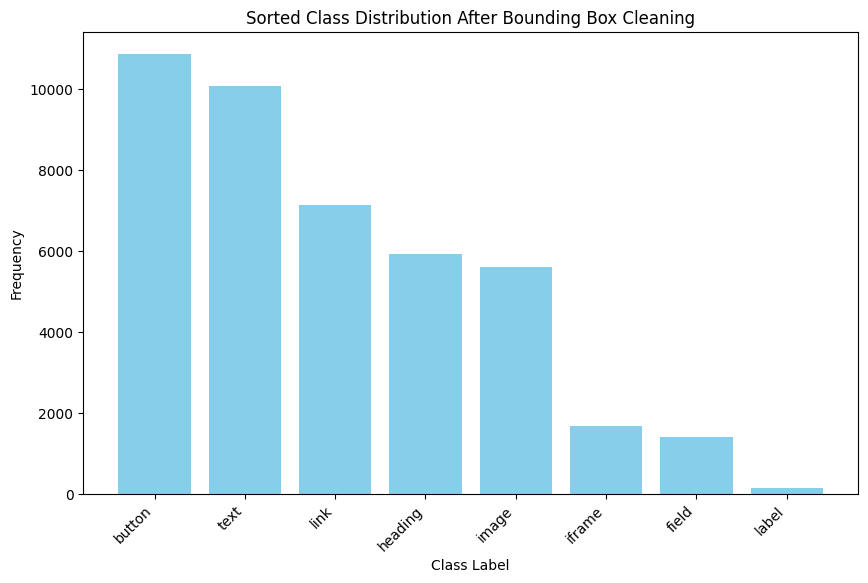

In [35]:
def count_class_distribution(label_path, class_names):
    class_counts = Counter()

    # Iterate over label files and count each class occurrence
    label_files = sorted([f for f in os.listdir(label_path) if f.endswith('.txt')])

    for label_file in label_files:
        with open(os.path.join(label_path, label_file), 'r') as f:
            annotations = f.readlines()
            for annot in annotations:
                class_idx = int(annot.split()[0])  # Get the class index
                class_counts[class_idx] += 1  # Increment the count for this class

    # Convert class indices to class names
    sorted_class_counts = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
    sorted_class_names = [class_names[i] for i, _ in sorted_class_counts]
    sorted_counts = [count for _, count in sorted_class_counts]

    return sorted_class_names, sorted_counts

# Path to label files
label_path = '/content/Website-Screenshots-1/train_model/labels'

# Get the sorted class distribution
sorted_class_names, sorted_counts = count_class_distribution(label_path, class_names)

# Plot the sorted class distribution
plt.figure(figsize=(10, 6))
plt.bar(sorted_class_names, sorted_counts, color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.title('Sorted Class Distribution After Bounding Box Cleaning')
plt.xlabel('Class Label')
plt.ylabel('Frequency')
plt.show()

## BOUNDING BOXES DESCRIPTIVE STATISTICS AFTER DATA CLEANING

In [36]:
from collections import defaultdict
import os
import pandas as pd

def bounding_box_statistics(copy_label_dir):
    """
    Calculates the statistics of bounding boxes for each class and returns a summary.
    """
    bbox_stats = defaultdict(list)  # Stores statistics for each class
    label_files = sorted([f for f in os.listdir(copy_label_dir) if f.endswith('.txt')])

    for label_file in label_files:
        label_path = os.path.join(copy_label_dir, label_file)

        with open(label_path, 'r') as f:
            labels = f.readlines()

        for label in labels:
            class_idx, x_center, y_center, width, height = map(float, label.strip().split())
            bbox_area = width * height
            bbox_stats[class_idx].append(bbox_area)

    # Calculate statistics
    stats_summary = {
        class_idx: {
            'Count': len(areas),
            'Mean': sum(areas) / len(areas) if areas else 0,
            'Min': min(areas) if areas else 0,
            'Max': max(areas) if areas else 0
        }
        for class_idx, areas in sorted(bbox_stats.items())  # Sort by class index
    }

    # Convert the summary to a DataFrame for tabular display
    stats_df = pd.DataFrame(stats_summary).T
    stats_df.index.name = 'Class'
    return stats_df

# Run the statistics calculation
stats = bounding_box_statistics(model_label_dir)

# Display the statistics as a sorted table
print(stats)


         Count      Mean       Min       Max
Class                                       
0.0    10875.0  0.015542  0.001007  0.817708
1.0     1412.0  0.013732  0.001053  0.094917
2.0     5942.0  0.024694  0.001007  0.812500
3.0     1678.0  0.685562  0.001551  1.000000
4.0     5624.0  0.058470  0.001007  0.882812
5.0      160.0  0.005607  0.001007  0.038387
6.0     7150.0  0.004654  0.001007  0.221484
7.0    10092.0  0.012584  0.001007  0.864583


MINORITY CLASS DEFINITION:

In [37]:
# Classi minoritarie definite
minority_classes = [1, 3, 5]  # label = 6, iframe = 7, field = 5


In [38]:
import os
from collections import defaultdict

def find_images_with_class_distribution(copy_label_dir, low_classes, high_classes, max_class_0_7=4, min_class_1_3_5=2):
    """
    Trova immagini con un basso contenuto di classi 0 e 7 e un alto contenuto di classi 1, 3 e 5.
    Restituisce le immagini e le statistiche per ciascuna immagine.
    """
    selected_images = []
    class_distribution_stats = []

    label_files2 = sorted([f for f in os.listdir(copy_label_dir) if f.endswith('.txt')])

    for label_file in label_files2:
        label_path = os.path.join(copy_label_dir, label_file)

        # Conteggio delle classi per ogni immagine
        class_counts = defaultdict(int)

        with open(label_path, 'r') as f:
            labels = f.readlines()

        for label in labels:
            class_idx = int(label.strip().split()[0])
            class_counts[class_idx] += 1

        # Verifica delle condizioni
        if class_counts[0] <= max_class_0_7 and class_counts[7] <= max_class_0_7 :  # Condizione per classi dominanti
            if class_counts[1] >= min_class_1_3_5 or class_counts[3] >= min_class_1_3_5 or class_counts[5] >= min_class_1_3_5:  # Condizione per classi minoritarie
                selected_images.append(label_file)
                class_distribution_stats.append(class_counts)

    # Statistiche descrittive finali
    total_images = len(selected_images)
    total_class_counts = defaultdict(int)

    for class_stats in class_distribution_stats:
        for class_idx, count in class_stats.items():
            total_class_counts[class_idx] += count

    return selected_images, total_images, total_class_counts

# Impostazioni delle classi
low_classes = [0, 7, 2, 4, 6]  # Classi con basso contenuto (0 e 7)
high_classes = [1, 3, 5]  # Classi con alto contenuto (1, 3, 5)

# FILTER:
selected_images, total_images, total_class_counts = find_images_with_class_distribution(
    model_label_dir, low_classes, high_classes, max_class_0_7=4, min_class_1_3_5=2)

# Visualizza i risultati
print(f"Images selected: {total_images}")
print(f"Class distribution in the selected images:")
for class_idx, count in total_class_counts.items():
    print(f"  Classe {class_idx}: {count}")


Images selected: 98
Class distribution in the selected images:
  Classe 0: 180
  Classe 2: 293
  Classe 7: 192
  Classe 1: 242
  Classe 4: 226
  Classe 6: 497
  Classe 5: 58
  Classe 3: 52


AVERAGE number of labels on each image found

In [39]:
def calculate_class_averages(total_class_counts, total_images):
    """
    Calcola la media delle istanze di ciascuna classe per immagine.
    """
    class_averages = {class_idx: count / total_images for class_idx, count in total_class_counts.items()}
    return class_averages

# Calcola le medie
class_averages = calculate_class_averages(total_class_counts, total_images)

# Visualizza le medie
print(f"Mean number of data points per image in the class:")
for class_idx, avg in class_averages.items():
    print(f"  Classe {class_idx}: {avg:.2f} (mean per image)")


Mean number of data points per image in the class:
  Classe 0: 1.84 (mean per image)
  Classe 2: 2.99 (mean per image)
  Classe 7: 1.96 (mean per image)
  Classe 1: 2.47 (mean per image)
  Classe 4: 2.31 (mean per image)
  Classe 6: 5.07 (mean per image)
  Classe 5: 0.59 (mean per image)
  Classe 3: 0.53 (mean per image)


# Modeling

In [40]:
import os

# Define the paths for renaming
dataset_path = '/content/Website-Screenshots-1'
train_old_path = os.path.join(dataset_path, 'train_old')
train_model_path = os.path.join(dataset_path, 'train_model')
train_new_path = os.path.join(dataset_path, 'train')

# First, rename 'train' to 'train_old' if it exists
if os.path.exists(train_new_path):
    os.rename(train_new_path, train_old_path)
    print(f"Renamed 'train' to 'train_old'")

# Then, rename 'train_model' to 'train'
if os.path.exists(train_model_path):
    os.rename(train_model_path, train_new_path)
    print(f"Renamed 'train_model' to 'train'")


Renamed 'train' to 'train_old'
Renamed 'train_model' to 'train'


In [41]:
!pip install ultralytics

In [42]:
def validate_labels(labels_path, num_classes):
    invalid_files = []
    for label_file in os.listdir(labels_path):
        with open(os.path.join(labels_path, label_file), 'r') as f:
            for line in f:
                class_idx = int(line.strip().split()[0])
                if class_idx < 0 or class_idx >= num_classes:
                    invalid_files.append(label_file)
                    break
    return invalid_files

# Assuming you have the number of classes from your data.yaml
num_classes = len(class_names)
invalid_labels = validate_labels('/content/Website-Screenshots-1/train/labels', num_classes)

if invalid_labels:
    print(f"Found {len(invalid_labels)} files with invalid class indices.")
else:
    print("All labels are valid.")


All labels are valid.


In [43]:
from ultralytics import YOLO

# Load YOLOv8 model (you can use a pretrained model like 'yolov8n.pt' or 'yolov8s.pt')
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 320MB/s]


In [44]:
# Train the YOLOv8 model
results = model.train(data='/content/Website-Screenshots-1/data.yaml',
                      epochs=20,
                      imgsz=608,
                      batch=16,
                      lr0=0.0008,            # Initial learning rate
                      lrf=0.001,             # Final learning rate
                      weight_decay=0.0005,  # Weight decay
                      momentum=0.9,       # Momentum
                      augment=True,          # Enable augmentations
                      )

Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Website-Screenshots-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=608, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tru

100%|██████████| 755k/755k [00:00<00:00, 76.0MB/s]


Overriding model.yaml nc=80 with nc=8

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 134MB/s]


AMP: checks passed ✅


train: Scanning /content/Website-Screenshots-1/train/labels... 2778 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2778/2778 [00:03<00:00, 718.04it/s] 

train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/artstation_com_png.rf.00e9b1b2a87351418ec7b46deb925259.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/artstation_com_png.rf.NjQJluMUiA8ypgE0HBVu.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/bangordailynews_com_png.rf.dEhQaXlIpImyECm2ZzN8.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/behance_net_png.rf.MRg7BnnRRv9gJ5DdJbUH.jpg: 10 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/behance_net_png.rf.cc0533314bf2c41c4504e63f4516ce36.jpg: 7 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/bing_com_png.rf.LYE99fXMkF27dwPqVfYF.jpg: 6 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/bing_com_png.rf.e3f668104402778e2cb846a123466840.jpg: 7 duplicate labels removed
train: WARNING ⚠️

train: New cache created: /content/Website-Screenshots-1/train/labels.cache


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/Website-Screenshots-1/valid/labels... 482 images, 0 backgrounds, 0 corrupt: 100%|██████████| 482/482 [00:00<00:00, 561.11it/s]

val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/bandsintown_com_png.rf.I19VlDFncZ0RifJhmfEU.jpg: 4 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/bandsintown_com_png.rf.b8462344187a5cdffe24d70019fabd0a.jpg: 4 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/deondernemer_nl_png.rf.c00a7c65fab4356b887dea5c9e96e8f3.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/deondernemer_nl_png.rf.mVLu7hIaZ8VUCwbhSF6c.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/flickr_com_png.rf.27963e0183770e78d58a8b78dc41715e.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/flickr_com_png.rf.IKOHXY9vM9t5eOz75BGX.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/foxnews_com_png.rf.10605c226e8ff71fd5510b806e5584b5.jpg: 2 duplicate labels removed
val: WARNING ⚠

Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0008' and 'momentum=0.9' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 608 train, 608 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      4.92G      1.785      3.117      1.444        263        608: 100%|██████████| 174/174 [00:58<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.41it/s]


                   all        482      20888       0.31      0.246      0.137     0.0795

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.27G      1.565      2.276      1.334        217        608: 100%|██████████| 174/174 [00:57<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.11it/s]


                   all        482      20888      0.372      0.248      0.186      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.76G      1.492      2.157      1.308        283        608: 100%|██████████| 174/174 [00:54<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.87it/s]

                   all        482      20888      0.422      0.253      0.212      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      3.33G       1.43      2.065      1.277        182        608: 100%|██████████| 174/174 [00:54<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]


                   all        482      20888      0.428      0.263      0.229      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      3.68G        1.4      2.017       1.26        277        608: 100%|██████████| 174/174 [00:53<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]

                   all        482      20888      0.436      0.272      0.235      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      4.18G      1.348      1.961      1.238        244        608: 100%|██████████| 174/174 [00:55<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.00it/s]

                   all        482      20888      0.419      0.315      0.249      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      3.78G      1.341      1.934      1.233        223        608: 100%|██████████| 174/174 [00:54<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.08it/s]

                   all        482      20888      0.444      0.291      0.256      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      4.12G      1.313        1.9      1.224        383        608: 100%|██████████| 174/174 [00:53<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]


                   all        482      20888      0.459      0.301       0.27      0.172

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      3.62G      1.286      1.864       1.21        216        608: 100%|██████████| 174/174 [00:51<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

                   all        482      20888      0.483      0.295      0.282      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      3.26G      1.276      1.841      1.203        140        608: 100%|██████████| 174/174 [00:53<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.13it/s]

                   all        482      20888      0.457      0.322      0.286       0.19


Closing dataloader mosaic


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      4.22G      1.299      1.918      1.211         96        608: 100%|██████████| 174/174 [00:54<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.47it/s]


                   all        482      20888      0.465      0.332      0.288      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      3.37G      1.278      1.849      1.199         51        608: 100%|██████████| 174/174 [00:56<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.98it/s]

                   all        482      20888      0.505      0.301      0.312      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      4.28G      1.265      1.811      1.191        171        608: 100%|██████████| 174/174 [00:55<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.30it/s]

                   all        482      20888      0.484       0.33      0.314      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.83G      1.237      1.779      1.183         49        608: 100%|██████████| 174/174 [00:52<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.92it/s]


                   all        482      20888      0.493      0.335      0.324      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.75G       1.22      1.749      1.172        138        608: 100%|██████████| 174/174 [00:50<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.12it/s]

                   all        482      20888      0.491      0.341      0.328      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.95G      1.204      1.713      1.165        115        608: 100%|██████████| 174/174 [00:53<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.73it/s]

                   all        482      20888      0.493      0.329      0.325      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.24G      1.185      1.697      1.154        163        608: 100%|██████████| 174/174 [00:53<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.21it/s]

                   all        482      20888      0.454       0.36      0.318       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      4.25G      1.177      1.673      1.154         78        608: 100%|██████████| 174/174 [00:53<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.23it/s]

                   all        482      20888      0.457       0.37      0.338      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      4.03G      1.163      1.648      1.143        169        608: 100%|██████████| 174/174 [00:52<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.85it/s]


                   all        482      20888      0.469       0.37      0.338      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      4.25G      1.153      1.638      1.142        116        608: 100%|██████████| 174/174 [00:50<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.02it/s]


                   all        482      20888      0.451      0.366      0.341       0.24

20 epochs completed in 0.340 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:16<00:00,  1.05s/it]


                   all        482      20888      0.409      0.387      0.346      0.242
                button        454       6354      0.531      0.408      0.419      0.277
                 field        242        366      0.334       0.65       0.57      0.441
               heading        428       1508      0.266      0.606      0.389      0.251
                iframe        102        158      0.217      0.367      0.263      0.211
                 image        468       3766      0.507      0.399      0.399      0.294
                 label         20         34      0.697      0.136      0.219       0.16
                  link        380       2654      0.337      0.323      0.282      0.181
                  text        468       6048      0.382      0.206      0.228      0.126
Speed: 0.1ms preprocess, 5.6ms inference, 0.0ms loss, 10.7ms postprocess per image
Results saved to runs/detect/train


In [45]:
model_path = '/content/Website-Screenshots-1/5_epoch_model.pt'  # Define the path to save your model
model.save(model_path)
print(f"Model saved at {model_path}")

Model saved at /content/Website-Screenshots-1/5_epoch_model.pt


In [46]:
test_images_path = '/content/Website-Screenshots-1/test/images'
test_image_files = sorted([f for f in os.listdir(test_images_path) if f.endswith('.jpg') or f.endswith('.png')])

# Limit to the first 10 images
test_image_files = test_image_files[:10]


image 1/1 /content/Website-Screenshots-1/test/images/addons_mozilla_org_png.rf.8pWFwr9ZblJ92BQghXBW.jpg: 480x608 6 buttons, 1 field, 7 headings, 5 images, 4 links, 7 texts, 108.4ms
Speed: 3.2ms preprocess, 108.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 608)


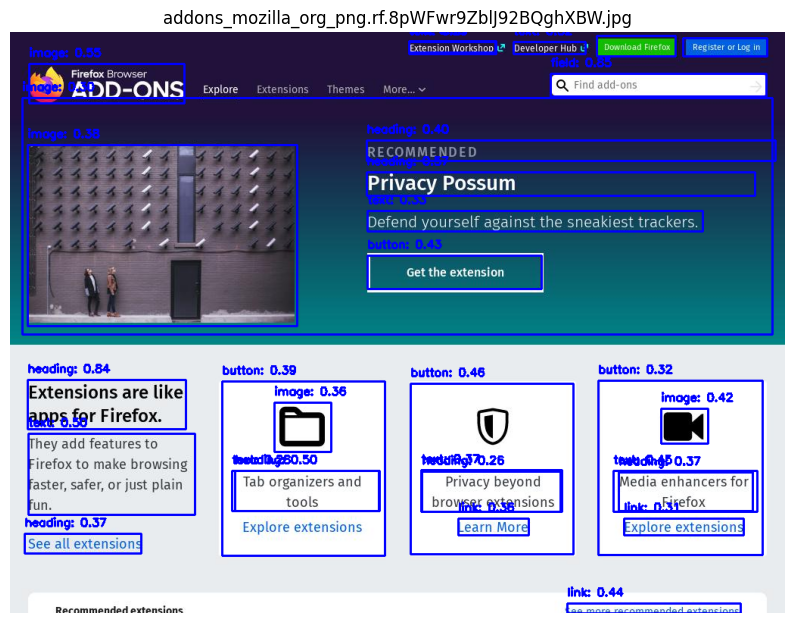


image 1/1 /content/Website-Screenshots-1/test/images/addons_mozilla_org_png.rf.ec9a8e78cd5c0e6ab255f50c408caecf.jpg: 480x608 6 buttons, 1 field, 7 headings, 5 images, 4 links, 7 texts, 29.5ms
Speed: 3.6ms preprocess, 29.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 608)


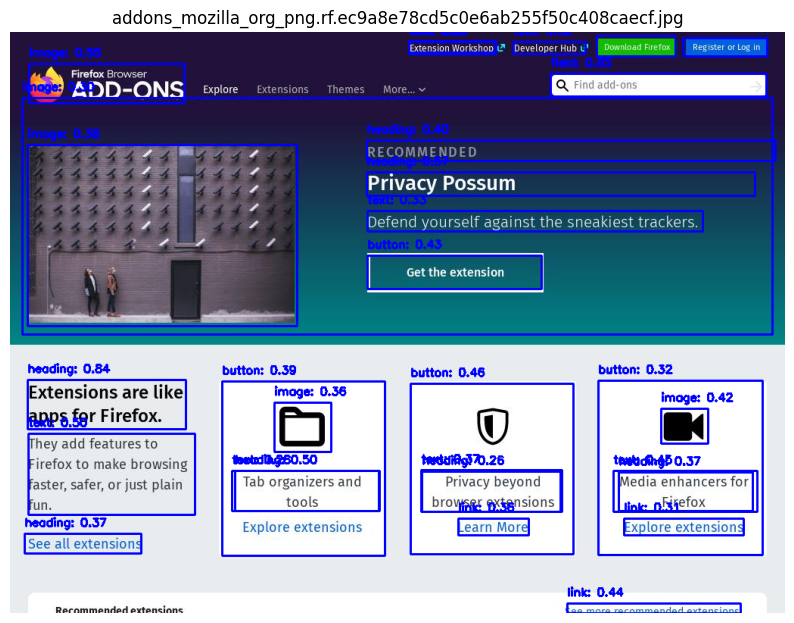


image 1/1 /content/Website-Screenshots-1/test/images/adf_ly_png.rf.490b629d732bbf70e8e1d3720f440c06.jpg: 480x608 9 buttons, 2 fields, 12 headings, 9 images, 1 link, 6 texts, 29.7ms
Speed: 3.9ms preprocess, 29.7ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 608)


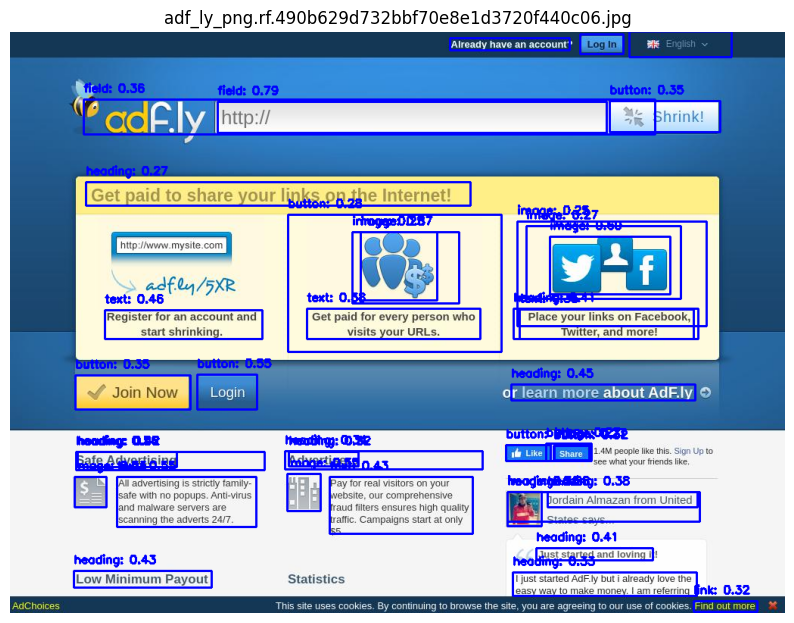


image 1/1 /content/Website-Screenshots-1/test/images/adf_ly_png.rf.wAqxeIIVZNBMd0Ljcsmr.jpg: 480x608 9 buttons, 2 fields, 12 headings, 9 images, 1 link, 6 texts, 31.1ms
Speed: 3.8ms preprocess, 31.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 608)


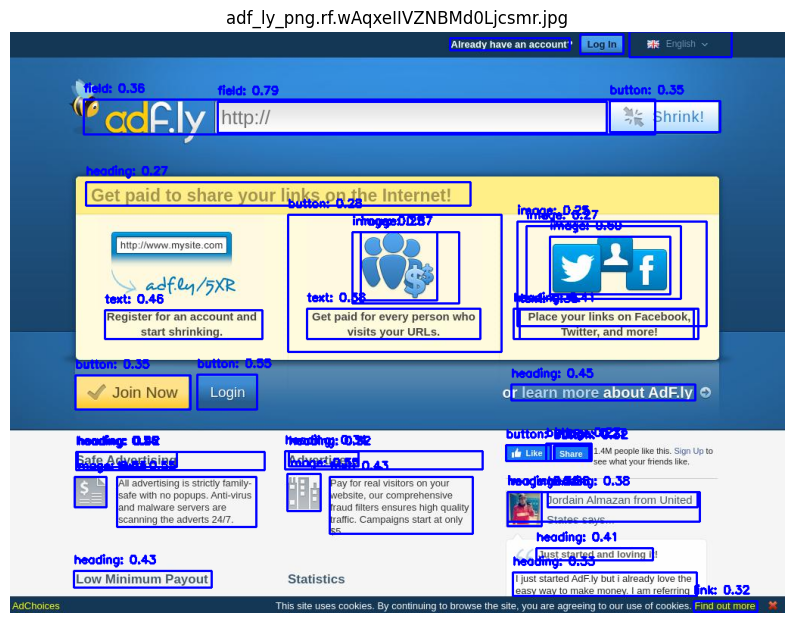


image 1/1 /content/Website-Screenshots-1/test/images/advancedcustomfields_com_png.rf.c4798c56992e8b9b953bdcc479c3fb39.jpg: 480x608 2 buttons, 3 fields, 2 headings, 2 images, 2 links, 2 texts, 29.9ms
Speed: 3.9ms preprocess, 29.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 608)


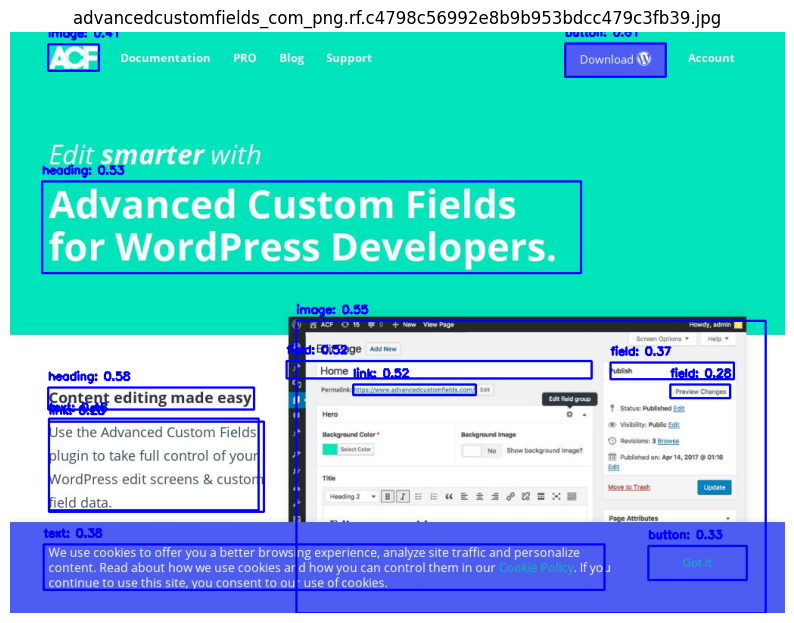


image 1/1 /content/Website-Screenshots-1/test/images/advancedcustomfields_com_png.rf.z0apExwDBHkpfuqG8tNi.jpg: 480x608 2 buttons, 3 fields, 2 headings, 2 images, 2 links, 2 texts, 32.2ms
Speed: 5.2ms preprocess, 32.2ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 608)


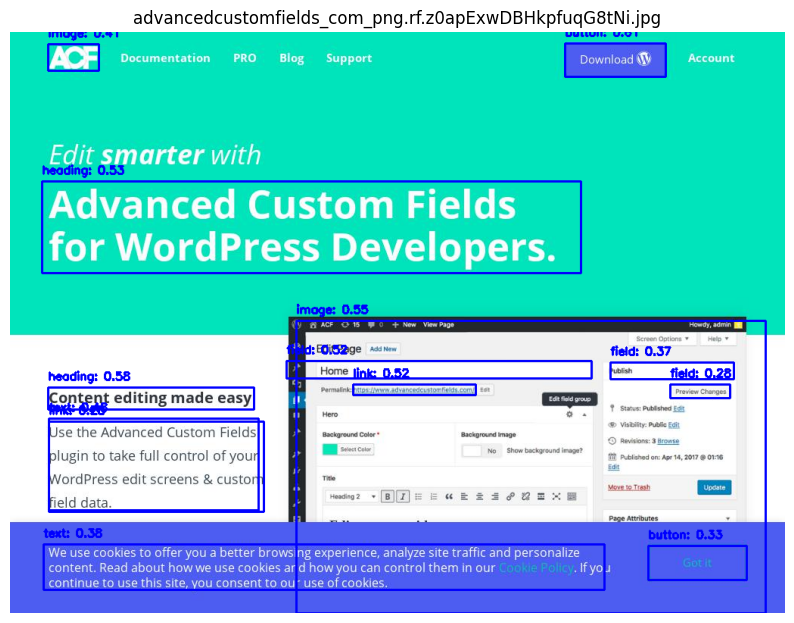


image 1/1 /content/Website-Screenshots-1/test/images/ajax_googleapis_com_png.rf.PNbTylokBBpmTpqVcrbA.jpg: 480x608 2 buttons, 2 fields, 2 headings, 4 links, 7 texts, 30.8ms
Speed: 4.0ms preprocess, 30.8ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 608)


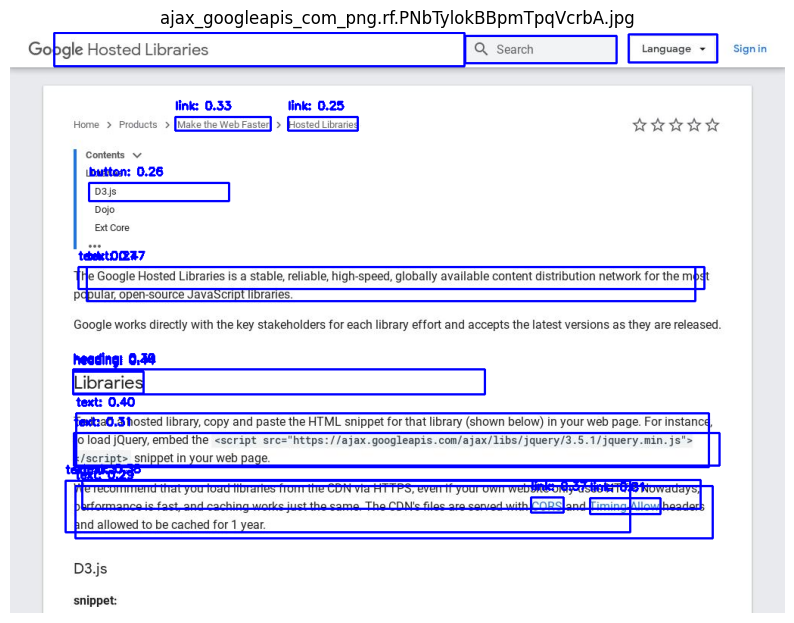


image 1/1 /content/Website-Screenshots-1/test/images/ajax_googleapis_com_png.rf.e01bdf5d1051cb669db41b1cfb76c9f2.jpg: 480x608 2 buttons, 2 fields, 2 headings, 4 links, 7 texts, 35.1ms
Speed: 4.0ms preprocess, 35.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 608)


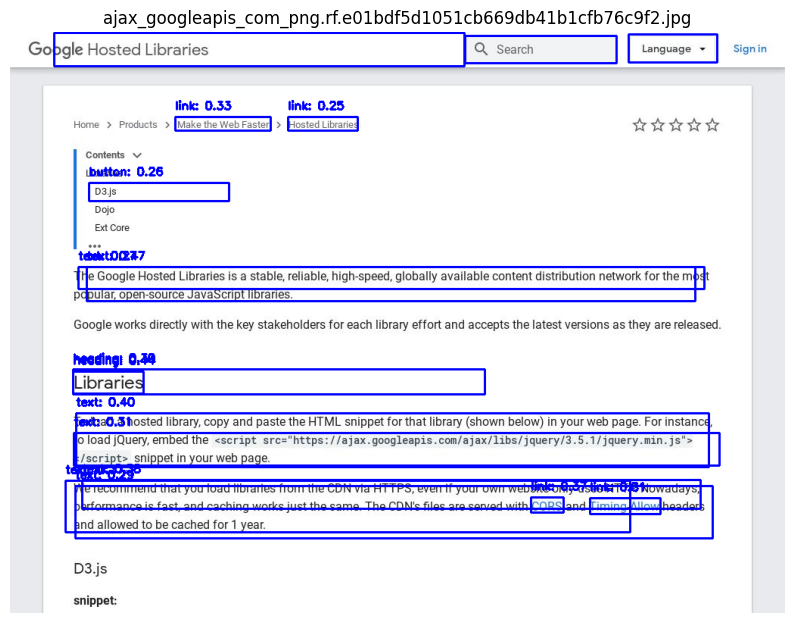


image 1/1 /content/Website-Screenshots-1/test/images/amazon_es_png.rf.619372b86a014058ba06a497c691b76a.jpg: 480x608 10 buttons, 3 fields, 8 headings, 10 images, 2 links, 2 texts, 33.7ms
Speed: 7.2ms preprocess, 33.7ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 608)


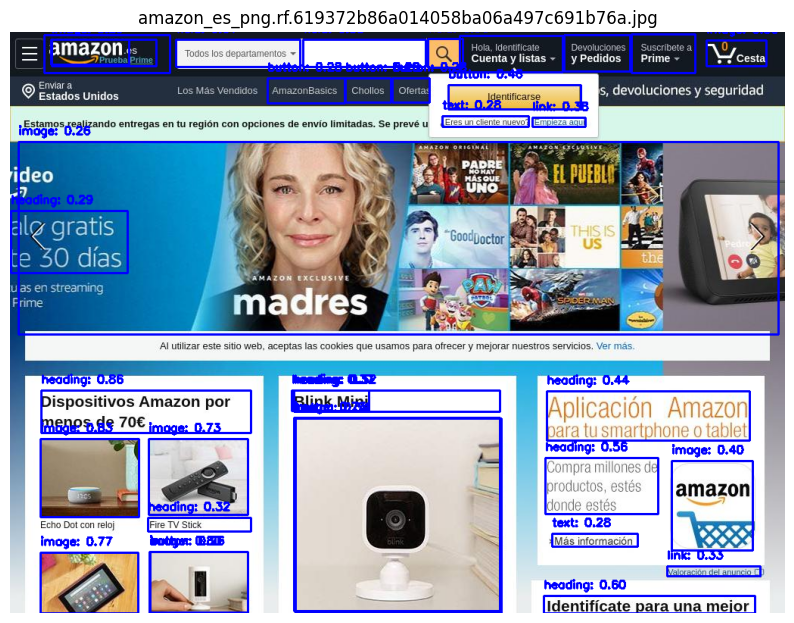


image 1/1 /content/Website-Screenshots-1/test/images/amazon_es_png.rf.Fii3VUhoRgEjCp6YyTw0.jpg: 480x608 10 buttons, 3 fields, 8 headings, 10 images, 2 links, 2 texts, 31.6ms
Speed: 3.8ms preprocess, 31.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 608)


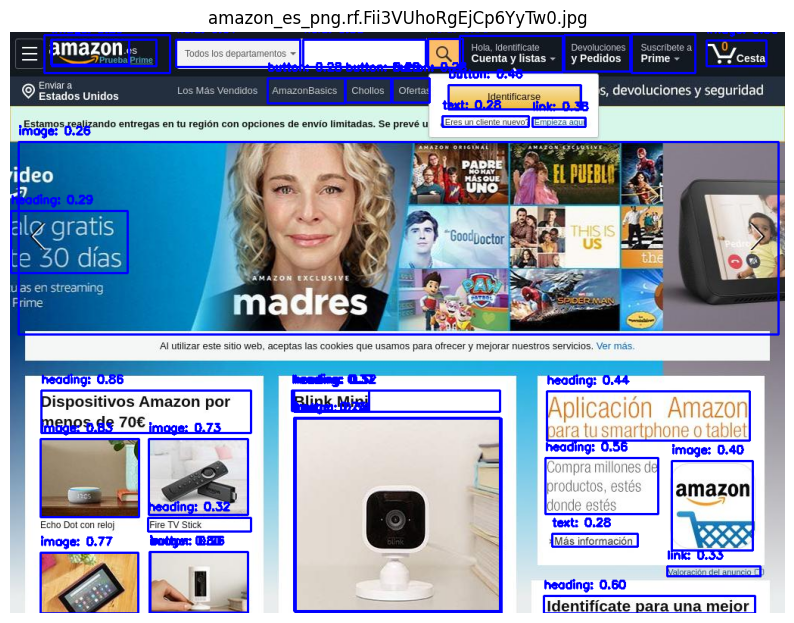

In [47]:
for image_file in test_image_files:
    image_path = os.path.join(test_images_path, image_file)

    # Make predictions
    reslist = model.predict(image_path)

    # Visualize predictions
    for res in reslist[:10]:
        img = res.orig_img  # Original image with predictions
        for box in res.boxes:
            x1, y1, x2, y2 = box.xyxy.cpu().numpy().astype(int)[0]
            cls = int(box.cls[0].cpu().numpy())  # Class index
            conf = box.conf[0].cpu().numpy()  # Confidence score

            # Draw bounding boxes
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            label = f"{model.names[cls]}: {conf:.2f}"
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        # Show the image with predictions
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(image_file)
        plt.show()


In [48]:
# Evaluate the model on the validation set
val_res = model.val(data='/content/Website-Screenshots-1/data.yaml')

Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/Website-Screenshots-1/valid/labels.cache... 482 images, 0 backgrounds, 0 corrupt: 100%|██████████| 482/482 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/bandsintown_com_png.rf.I19VlDFncZ0RifJhmfEU.jpg: 4 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/bandsintown_com_png.rf.b8462344187a5cdffe24d70019fabd0a.jpg: 4 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/deondernemer_nl_png.rf.c00a7c65fab4356b887dea5c9e96e8f3.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/deondernemer_nl_png.rf.mVLu7hIaZ8VUCwbhSF6c.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/flickr_com_png.rf.27963e0183770e78d58a8b78dc41715e.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/flickr_com_png.rf.IKOHXY9vM9t5eOz75BGX.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/foxnews_com_png.rf.10605c226e8ff71fd5510b806e5584b5.jpg: 2 duplicate labels removed
val: WARNING ⚠


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:19<00:00,  1.61it/s]


                   all        482      20888      0.409      0.387      0.347      0.242
                button        454       6354      0.533      0.408      0.421      0.277
                 field        242        366      0.334       0.65      0.571      0.443
               heading        428       1508      0.266      0.606      0.388      0.251
                iframe        102        158      0.216      0.367      0.262      0.212
                 image        468       3766      0.506      0.399      0.399      0.294
                 label         20         34      0.697      0.137      0.219      0.149
                  link        380       2654      0.339      0.323      0.284      0.185
                  text        468       6048       0.38      0.205      0.227      0.126
Speed: 0.2ms preprocess, 11.2ms inference, 0.0ms loss, 12.5ms postprocess per image
Results saved to runs/detect/train2


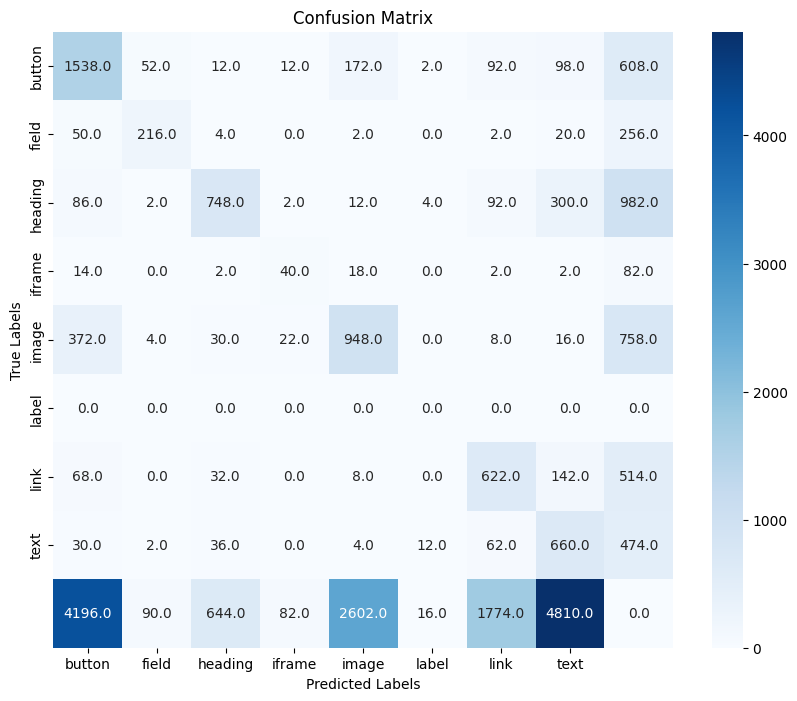

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

# Access the confusion matrix from the validation results
conf_matrix = val_res.confusion_matrix.matrix

# Class names (replace these with actual class names if needed)
class_names = ['button', 'field', 'heading', 'iframe', 'image', 'label', 'link', 'text']

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt=".1f", cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


In [50]:
import numpy as np
import pandas as pd  # Import pandas for table creation

# Access the confusion matrix
conf_matrix = val_res.confusion_matrix.matrix

# Initialize lists to store precision, recall, and F1-score
precisions = []
recalls = []
f1_scores = []

# Class names (replace with actual class names if needed)
class_names = ['button', 'field', 'heading', 'iframe', 'image', 'label', 'link', 'text']

# Calculate metrics for each class
for i in range(len(class_names)):
    tp = conf_matrix[i, i]  # True positives
    fp = conf_matrix[:, i].sum() - tp  # False positives
    fn = conf_matrix[i, :].sum() - tp  # False negatives

    # Precision and recall calculations
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)

# Create a DataFrame to hold the results
results_df = pd.DataFrame({
    'Class': class_names,
    'Precision': precisions,
    'Recall': recalls,
    'F1-Score': f1_scores
})

# Set the Class column as the index
results_df.set_index('Class', inplace=True)

# Print the results in table format
print(results_df)


         Precision    Recall  F1-Score
Class                                 
button    0.242052  0.594741  0.344072
field     0.590164  0.392727  0.471616
heading   0.496021  0.335727  0.400428
iframe    0.253165  0.250000  0.251572
image     0.251726  0.439296  0.320054
label     0.000000  0.000000  0.000000
link      0.234363  0.448773  0.307921
text      0.109127  0.515625  0.180131


### Modeling With Data Merged and iframe removed

In [51]:
# Define the paths to the original folders and the new cloned folders
base_path = '/content/Website-Screenshots-1'  # Change this to your dataset's root directory
folders_to_clone = ['train', 'test', 'valid']

# Clone each folder
for folder in folders_to_clone:
    original_folder = os.path.join(base_path, folder)
    cloned_folder = os.path.join(base_path, f"{folder}_modelv2")

    # Create the clone folder if it doesn't exist
    if not os.path.exists(cloned_folder):
        os.makedirs(cloned_folder)

    # Copy all files and subdirectories to the clone
    for item in os.listdir(original_folder):
        source = os.path.join(original_folder, item)
        destination = os.path.join(cloned_folder, item)
        if os.path.isdir(source):
            shutil.copytree(source, destination)
        else:
            shutil.copy2(source, destination)

print("Cloning complete: created train_model, test_model, and valid_model folders with all files.")

Cloning complete: created train_model, test_model, and valid_model folders with all files.


In [52]:
def remove_class_from_labels(copy_label_dir, class_to_remove):
    """
    Rimuove una classe specifica dai file di etichette.
    """
    label_files2 = sorted([f for f in os.listdir(copy_label_dir) if f.endswith('.txt')])

    for label_file in label_files2:
        label_path = os.path.join(copy_label_dir, label_file)

        # Leggi e filtra le etichette
        updated_labels = []
        with open(label_path, 'r') as f:
            labels = f.readlines()
            for label in labels:
                class_idx, x_center, y_center, width, height = map(float, label.strip().split())
                if int(class_idx) != class_to_remove:  # Rimuovi solo la classe specificata
                    updated_labels.append(f"{int(class_idx)} {x_center} {y_center} {width} {height}\n")

        # Sovrascrivi il file di etichette senza la classe rimossa
        with open(label_path, 'w') as f:
            f.writelines(updated_labels)

        print(f"Class {class_to_remove} removed from {label_file}")

# Rimuovere la classe 'iframe' (Classe 3)
remove_class_from_labels('/content/Website-Screenshots-1/train_modelv2/labels', class_to_remove=3)
remove_class_from_labels('/content/Website-Screenshots-1/test_modelv2/labels', class_to_remove=3)
remove_class_from_labels('/content/Website-Screenshots-1/valid_modelv2/labels', class_to_remove=3)



Class 3 removed from 4shared_com_png.rf.56ESfdbTeqhYqGJTPaY7.txt
Class 3 removed from 4shared_com_png.rf.7da0b596a12c1c1885dbdbc808d9c846.txt
Class 3 removed from 7-zip_org_png.rf.Q8hW3vouJvjGyI2FLxuy.txt
Class 3 removed from 7-zip_org_png.rf.a1e68d22bb88d429ee318e8c85c917f9.txt
Class 3 removed from 9to5mac_com_png.rf.NcF4DV5kC6mqzV9v1jIZ.txt
Class 3 removed from 9to5mac_com_png.rf.b280c437f46781de696d7057495c4bf9.txt
Class 3 removed from a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6.txt
Class 3 removed from a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_0.txt
Class 3 removed from a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_1.txt
Class 3 removed from a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_2.txt
Class 3 removed from a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_3.txt
Class 3 removed from a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_4.txt
Class 3 removed from a_co_png.rf.ylebNBaJK2rVV9zCeJsF.txt
Class 3 removed from a_co_png.rf.ylebNBaJK2rVV9zCeJsF_aug_0.txt
Class 

In [53]:
def merge_classes_in_labels(copy_label_dir, from_class_idx, to_class_idx):
    """
    Unisce due classi nel file delle etichette, sostituendo tutte le istanze della classe from_class_idx con to_class_idx.
    """
    label_files2 = sorted([f for f in os.listdir(copy_label_dir) if f.endswith('.txt')])

    for label_file in label_files2:
        label_path = os.path.join(copy_label_dir, label_file)

        # Leggi e modifica le etichette
        updated_labels = []
        with open(label_path, 'r') as f:
            labels = f.readlines()
            for label in labels:
                class_idx, x_center, y_center, width, height = map(float, label.strip().split())
                if int(class_idx) == from_class_idx:
                    class_idx = to_class_idx  # Sostituisci la classe
                updated_labels.append(f"{int(class_idx)} {x_center} {y_center} {width} {height}\n")

        # Sovrascrivi il file di etichette con le classi unite
        with open(label_path, 'w') as f:
            f.writelines(updated_labels)

        print(f"Classi {from_class_idx} unite con {to_class_idx} in {label_file}")

# Unire la classe 'field' (Classe 1) con 'label' (Classe 5)
merge_classes_in_labels('/content/Website-Screenshots-1/train_modelv2/labels', from_class_idx=5, to_class_idx=1)
merge_classes_in_labels('/content/Website-Screenshots-1/test_modelv2/labels', from_class_idx=5, to_class_idx=1)
merge_classes_in_labels('/content/Website-Screenshots-1/valid_modelv2/labels', from_class_idx=5, to_class_idx=1)


Classi 5 unite con 1 in 4shared_com_png.rf.56ESfdbTeqhYqGJTPaY7.txt
Classi 5 unite con 1 in 4shared_com_png.rf.7da0b596a12c1c1885dbdbc808d9c846.txt
Classi 5 unite con 1 in 7-zip_org_png.rf.Q8hW3vouJvjGyI2FLxuy.txt
Classi 5 unite con 1 in 7-zip_org_png.rf.a1e68d22bb88d429ee318e8c85c917f9.txt
Classi 5 unite con 1 in 9to5mac_com_png.rf.NcF4DV5kC6mqzV9v1jIZ.txt
Classi 5 unite con 1 in 9to5mac_com_png.rf.b280c437f46781de696d7057495c4bf9.txt
Classi 5 unite con 1 in a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6.txt
Classi 5 unite con 1 in a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_0.txt
Classi 5 unite con 1 in a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_1.txt
Classi 5 unite con 1 in a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_2.txt
Classi 5 unite con 1 in a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_3.txt
Classi 5 unite con 1 in a_co_png.rf.ee1872c1b2d3f0f503c751ceed58cac6_aug_4.txt
Classi 5 unite con 1 in a_co_png.rf.ylebNBaJK2rVV9zCeJsF.txt
Classi 5 unite con 1 in a_co_pn

In [54]:
'''
import yaml

# Define the path to the data.yaml file
yaml_file_path = '/content/Website-Screenshots-1/data.yaml'

# Load the existing data.yaml file
with open(yaml_file_path, 'r') as file:
    data = yaml.safe_load(file)

# Modify the class names
# Remove 'iframe' (index 3) and merge 'field' (index 1) into 'label' (index 5)
data['names'] = [
    'button',    # index 0
    'label',     # 'field' merged into 'label' (index 1)
    'heading',   # index 2
    'image',     # index 3
    'link',      # index 4
    'text'       # index 5
]
data['nc'] = len(data['names'])  # Update the number of classes

# Save the updated data.yaml file
with open(yaml_file_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

print("data.yaml has been updated successfully.")
'''

'\nimport yaml\n\n# Define the path to the data.yaml file\nyaml_file_path = \'/content/Website-Screenshots-1/data.yaml\'\n\n# Load the existing data.yaml file\nwith open(yaml_file_path, \'r\') as file:\n    data = yaml.safe_load(file)\n\n# Modify the class names\n# Remove \'iframe\' (index 3) and merge \'field\' (index 1) into \'label\' (index 5)\ndata[\'names\'] = [\n    \'button\',    # index 0\n    \'label\',     # \'field\' merged into \'label\' (index 1)\n    \'heading\',   # index 2\n    \'image\',     # index 3\n    \'link\',      # index 4\n    \'text\'       # index 5\n]\ndata[\'nc\'] = len(data[\'names\'])  # Update the number of classes\n\n# Save the updated data.yaml file\nwith open(yaml_file_path, \'w\') as file:\n    yaml.dump(data, file, default_flow_style=False)\n\nprint("data.yaml has been updated successfully.")\n'

In [55]:
import os

def get_unique_classes_from_labels(label_dir):
    """
    Get unique class indices from label files in the specified directory.

    :param label_dir: Directory containing the label files.
    :return: A set of unique class indices.
    """
    unique_classes = set()
    label_files = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])

    for label_file in label_files:
        label_path = os.path.join(label_dir, label_file)

        with open(label_path, 'r') as f:
            labels = f.readlines()
            for label in labels:
                class_idx = int(label.strip().split()[0])  # Get the class index
                unique_classes.add(class_idx)  # Add to the set of unique classes

    return unique_classes

# Specify the directory containing the training labels
label_directory = '/content/Website-Screenshots-1/train_modelv2/labels'
unique_classes = get_unique_classes_from_labels(label_directory)

# Print the unique classes
print("Unique classes in the training dataset:", unique_classes)


Unique classes in the training dataset: {0, 1, 2, 4, 6, 7}


In [56]:
import os

# Define the paths for renaming
dataset_path = '/content/Website-Screenshots-1'
train_old_path = os.path.join(dataset_path, 'train_old2')
train_model_path = os.path.join(dataset_path, 'train_modelv2')
train_new_path = os.path.join(dataset_path, 'train')

# First, rename 'train' to 'train_old' if it exists
if os.path.exists(train_new_path):
    os.rename(train_new_path, train_old_path)
    print(f"Renamed 'train' to 'train_old'")

# Then, rename 'train_model' to 'train'
if os.path.exists(train_model_path):
    os.rename(train_model_path, train_new_path)
    print(f"Renamed 'train_model' to 'train'")


Renamed 'train' to 'train_old'
Renamed 'train_model' to 'train'


In [57]:
from ultralytics import YOLO

# Load YOLOv8 model (you can use a pretrained model like 'yolov8n.pt' or 'yolov8s.pt')
model2 = YOLO('yolov8n.pt')

In [58]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [59]:
# Train the YOLOv8 model
results2 = model2.train(data='/content/Website-Screenshots-1/data.yaml',
                      epochs=20,
                      imgsz=608,
                      batch=16,
                      lr0=0.0008,            # Initial learning rate
                      lrf=0.001,             # Final learning rate
                      weight_decay=0.0005,  # Weight decay
                      momentum=0.9,       # Momentum
                      augment=True,          # Enable augmentations
                      )

Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Website-Screenshots-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=608, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tr

train: Scanning /content/Website-Screenshots-1/train/labels... 2778 images, 1091 backgrounds, 0 corrupt: 100%|██████████| 2778/2778 [00:01<00:00, 1979.83it/s]

train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/artstation_com_png.rf.00e9b1b2a87351418ec7b46deb925259.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/artstation_com_png.rf.NjQJluMUiA8ypgE0HBVu.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/bangordailynews_com_png.rf.dEhQaXlIpImyECm2ZzN8.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/behance_net_png.rf.MRg7BnnRRv9gJ5DdJbUH.jpg: 10 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/behance_net_png.rf.cc0533314bf2c41c4504e63f4516ce36.jpg: 7 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/bing_com_png.rf.LYE99fXMkF27dwPqVfYF.jpg: 6 duplicate labels removed
train: WARNING ⚠️ /content/Website-Screenshots-1/train/images/bing_com_png.rf.e3f668104402778e2cb846a123466840.jpg: 7 duplicate labels removed
train: WARNING ⚠️

train: New cache created: /content/Website-Screenshots-1/train/labels.cache


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/Website-Screenshots-1/valid/labels.cache... 482 images, 0 backgrounds, 0 corrupt: 100%|██████████| 482/482 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/bandsintown_com_png.rf.I19VlDFncZ0RifJhmfEU.jpg: 4 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/bandsintown_com_png.rf.b8462344187a5cdffe24d70019fabd0a.jpg: 4 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/deondernemer_nl_png.rf.c00a7c65fab4356b887dea5c9e96e8f3.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/deondernemer_nl_png.rf.mVLu7hIaZ8VUCwbhSF6c.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/flickr_com_png.rf.27963e0183770e78d58a8b78dc41715e.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/flickr_com_png.rf.IKOHXY9vM9t5eOz75BGX.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/foxnews_com_png.rf.10605c226e8ff71fd5510b806e5584b5.jpg: 2 duplicate labels removed
val: WARNING ⚠

Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0008' and 'momentum=0.9' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 608 train, 608 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      5.23G      1.958      3.259      1.466        246        608: 100%|██████████| 174/174 [01:01<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]


                   all        482      20888      0.436      0.233       0.14     0.0784

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.33G      1.716      2.435      1.349        201        608: 100%|██████████| 174/174 [01:01<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.00it/s]

                   all        482      20888       0.49      0.227      0.181      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.84G      1.629      2.311      1.325        271        608: 100%|██████████| 174/174 [00:58<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.85it/s]

                   all        482      20888      0.289      0.241       0.21      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      3.45G      1.585       2.24      1.306        164        608: 100%|██████████| 174/174 [00:57<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.24it/s]


                   all        482      20888      0.257      0.255      0.217      0.132

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      3.74G      1.551      2.176      1.287        255        608: 100%|██████████| 174/174 [01:00<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.01it/s]

                   all        482      20888      0.282      0.264      0.227      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      4.26G      1.494      2.133      1.262        229        608: 100%|██████████| 174/174 [00:59<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.07it/s]

                   all        482      20888      0.275      0.276      0.243      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      3.84G      1.485      2.094      1.259        207        608: 100%|██████████| 174/174 [01:06<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.78it/s]

                   all        482      20888      0.278      0.286      0.237      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20       4.4G       1.46      2.072      1.252        357        608: 100%|██████████| 174/174 [00:56<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.09it/s]


                   all        482      20888      0.303      0.278      0.254      0.161

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      3.67G      1.426      2.038      1.234        199        608: 100%|██████████| 174/174 [01:00<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.17it/s]

                   all        482      20888      0.298       0.28      0.259      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      3.32G      1.412       2.01      1.226        125        608: 100%|██████████| 174/174 [00:59<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.13it/s]

                   all        482      20888      0.301      0.289       0.26      0.171


Closing dataloader mosaic


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      4.28G       1.39      2.039       1.23         88        608: 100%|██████████| 174/174 [00:56<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.07it/s]


                   all        482      20888      0.287      0.303      0.256      0.167

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      3.43G      1.372      1.977      1.218         45        608: 100%|██████████| 174/174 [00:57<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.10it/s]

                   all        482      20888      0.317      0.277      0.262      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      4.36G      1.355      1.939      1.209        167        608: 100%|██████████| 174/174 [00:55<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.06it/s]


                   all        482      20888      0.292      0.304      0.267      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.89G      1.329      1.905      1.203         43        608: 100%|██████████| 174/174 [00:55<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.15it/s]

                   all        482      20888      0.325      0.295      0.271      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.82G      1.311      1.878      1.191        133        608: 100%|██████████| 174/174 [00:55<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.87it/s]

                   all        482      20888      0.331      0.293      0.278      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      4.01G      1.292      1.837      1.185        109        608: 100%|██████████| 174/174 [00:55<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.04it/s]


                   all        482      20888      0.309      0.303      0.278      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.31G      1.275      1.819      1.172        157        608: 100%|██████████| 174/174 [00:57<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.19it/s]

                   all        482      20888      0.314      0.304      0.276      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20       4.3G      1.269      1.793      1.173         69        608: 100%|██████████| 174/174 [00:54<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.20it/s]


                   all        482      20888       0.33      0.307      0.288      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      4.11G       1.25      1.758       1.16        166        608: 100%|██████████| 174/174 [00:56<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.25it/s]

                   all        482      20888      0.327      0.314      0.289      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      4.32G      1.241      1.753      1.157        111        608: 100%|██████████| 174/174 [00:57<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.08it/s]

                   all        482      20888      0.326      0.308      0.288      0.197



20 epochs completed in 0.369 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:17<00:00,  1.09s/it]


                   all        482      20888      0.316      0.309      0.284      0.193
                button        454       6354      0.597      0.359      0.419      0.274
                 field        242        366      0.307      0.661      0.531      0.406
               heading        428       1508      0.297      0.581      0.409      0.267
                iframe        102        158          0          0          0          0
                 image        468       3766      0.542      0.375      0.389      0.283
                 label         20         34          0          0          0          0
                  link        380       2654      0.367      0.316      0.295      0.189
                  text        468       6048       0.42      0.184      0.227      0.125
Speed: 0.2ms preprocess, 5.1ms inference, 0.0ms loss, 12.7ms postprocess per image
Results saved to runs/detect/train3


In [60]:
model_path = '/content/Website-Screenshots-1/5_epoch_model_merged.pt'  # Define the path to save your model
model2.save(model_path)
print(f"Model saved at {model_path}")

Model saved at /content/Website-Screenshots-1/5_epoch_model_merged.pt


In [61]:
test_images_path = '/content/Website-Screenshots-1/test/images'
test_image_files = sorted([f for f in os.listdir(test_images_path) if f.endswith('.jpg') or f.endswith('.png')])

# Limit to the first 10 images
test_image_files = test_image_files[:10]


image 1/1 /content/Website-Screenshots-1/test/images/addons_mozilla_org_png.rf.8pWFwr9ZblJ92BQghXBW.jpg: 480x608 3 buttons, 1 field, 4 headings, 3 images, 5 links, 9 texts, 29.4ms
Speed: 3.1ms preprocess, 29.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 608)


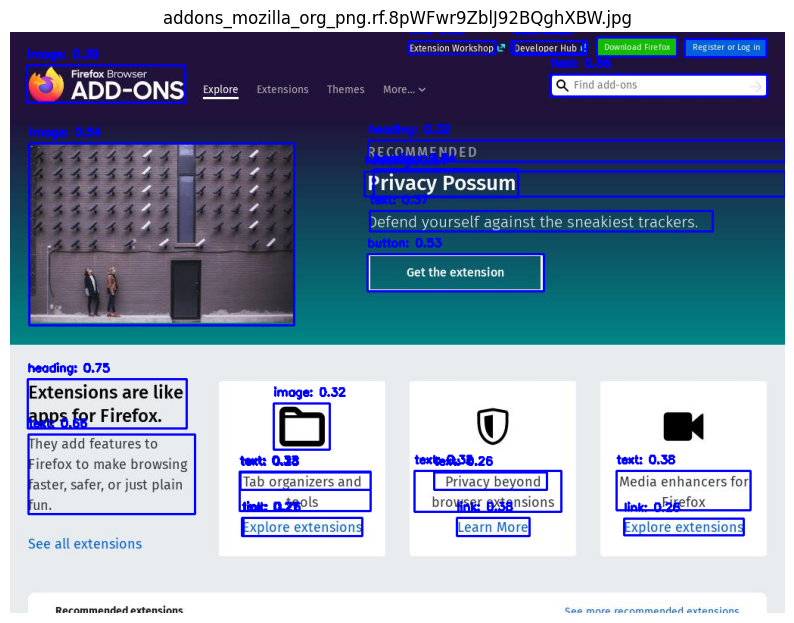


image 1/1 /content/Website-Screenshots-1/test/images/addons_mozilla_org_png.rf.ec9a8e78cd5c0e6ab255f50c408caecf.jpg: 480x608 3 buttons, 1 field, 4 headings, 3 images, 5 links, 9 texts, 36.4ms
Speed: 5.0ms preprocess, 36.4ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 608)


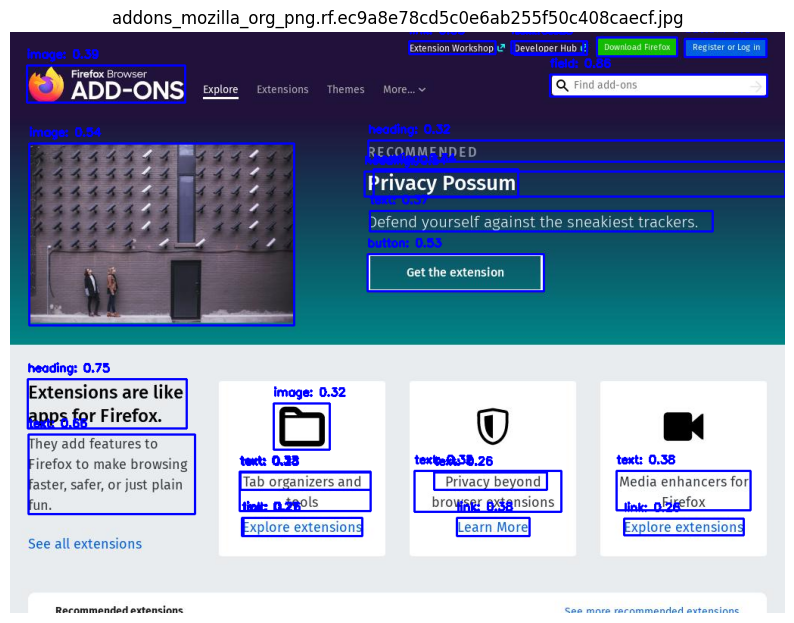


image 1/1 /content/Website-Screenshots-1/test/images/adf_ly_png.rf.490b629d732bbf70e8e1d3720f440c06.jpg: 480x608 9 buttons, 3 fields, 13 headings, 9 images, 1 link, 6 texts, 33.9ms
Speed: 3.4ms preprocess, 33.9ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 608)


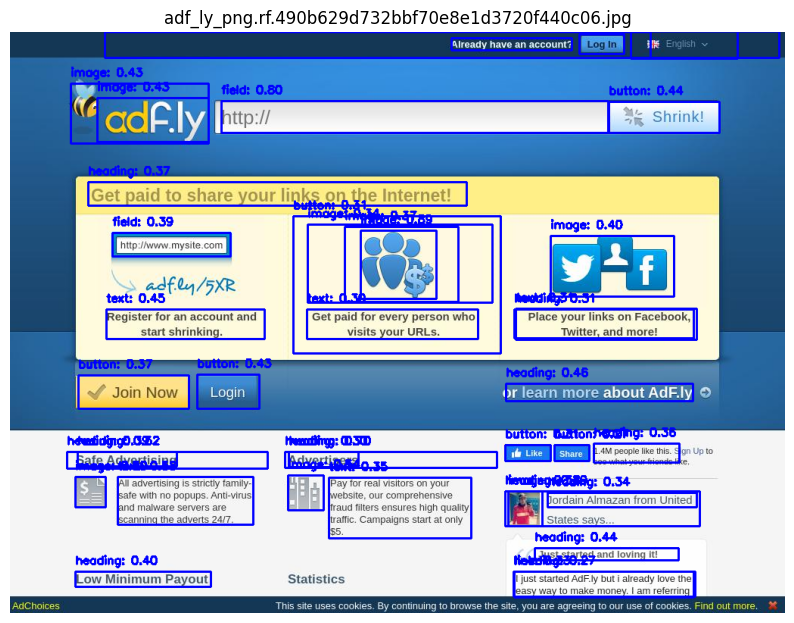


image 1/1 /content/Website-Screenshots-1/test/images/adf_ly_png.rf.wAqxeIIVZNBMd0Ljcsmr.jpg: 480x608 9 buttons, 3 fields, 13 headings, 9 images, 1 link, 6 texts, 36.6ms
Speed: 3.6ms preprocess, 36.6ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 608)


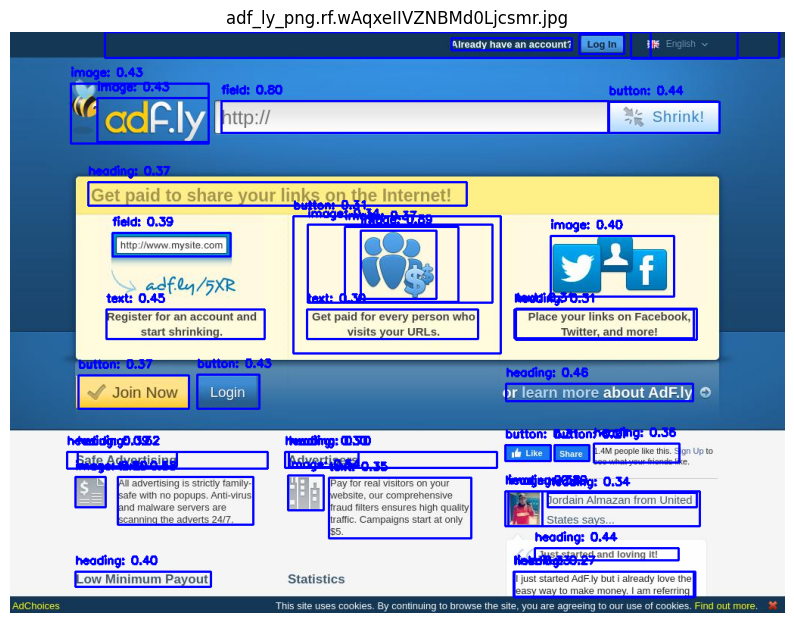


image 1/1 /content/Website-Screenshots-1/test/images/advancedcustomfields_com_png.rf.c4798c56992e8b9b953bdcc479c3fb39.jpg: 480x608 1 button, 4 fields, 2 headings, 3 images, 1 link, 3 texts, 33.8ms
Speed: 4.7ms preprocess, 33.8ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 608)


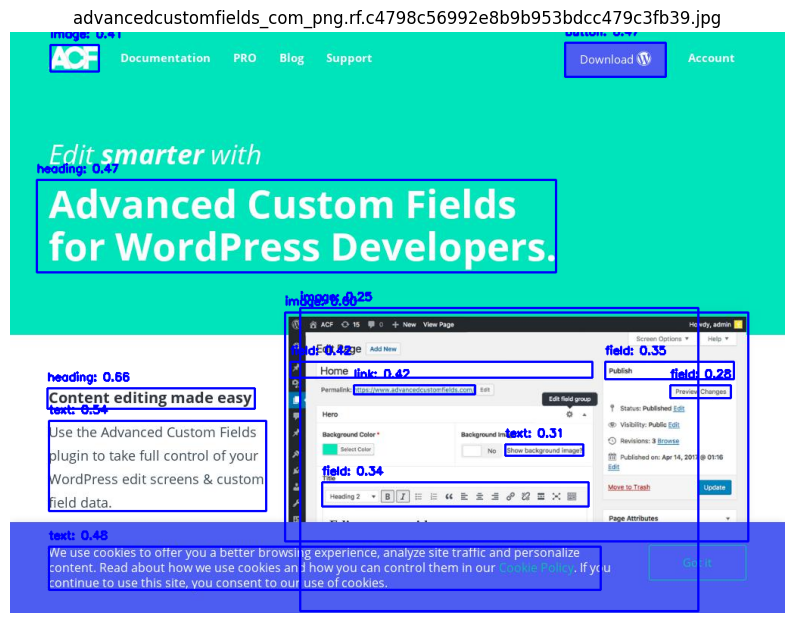


image 1/1 /content/Website-Screenshots-1/test/images/advancedcustomfields_com_png.rf.z0apExwDBHkpfuqG8tNi.jpg: 480x608 1 button, 4 fields, 2 headings, 3 images, 1 link, 3 texts, 31.3ms
Speed: 7.1ms preprocess, 31.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 608)


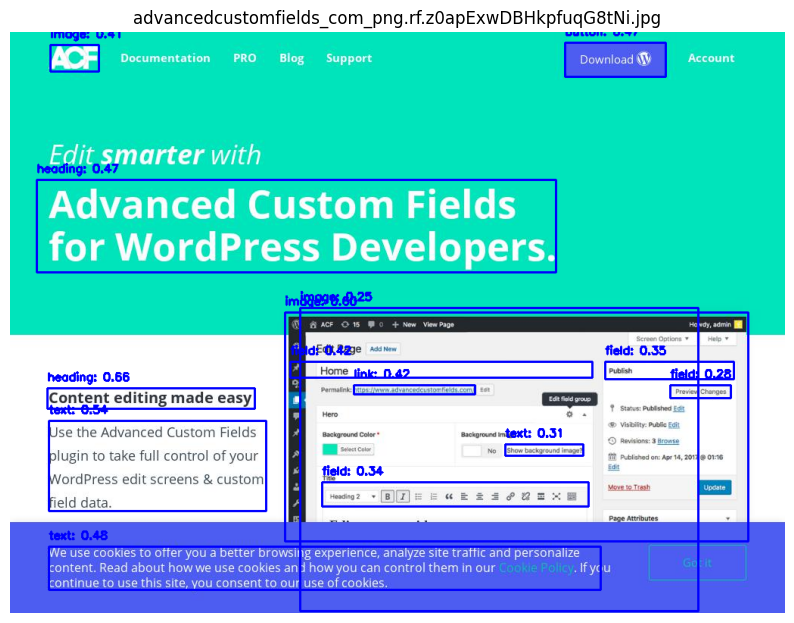


image 1/1 /content/Website-Screenshots-1/test/images/ajax_googleapis_com_png.rf.PNbTylokBBpmTpqVcrbA.jpg: 480x608 2 buttons, 2 fields, 2 headings, 3 links, 7 texts, 32.0ms
Speed: 3.6ms preprocess, 32.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 608)


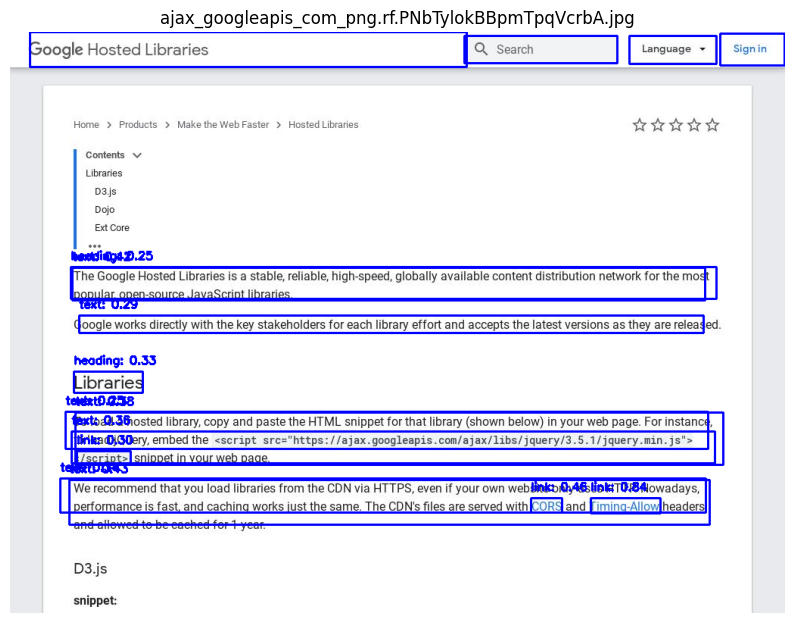


image 1/1 /content/Website-Screenshots-1/test/images/ajax_googleapis_com_png.rf.e01bdf5d1051cb669db41b1cfb76c9f2.jpg: 480x608 2 buttons, 2 fields, 2 headings, 3 links, 7 texts, 47.2ms
Speed: 3.7ms preprocess, 47.2ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 608)


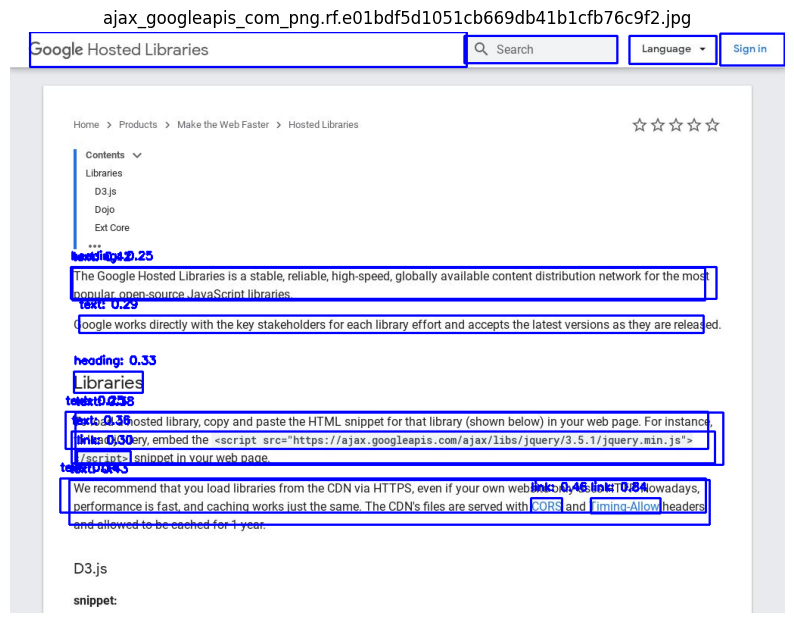


image 1/1 /content/Website-Screenshots-1/test/images/amazon_es_png.rf.619372b86a014058ba06a497c691b76a.jpg: 480x608 12 buttons, 4 fields, 10 headings, 7 images, 3 links, 4 texts, 59.8ms
Speed: 3.8ms preprocess, 59.8ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 608)


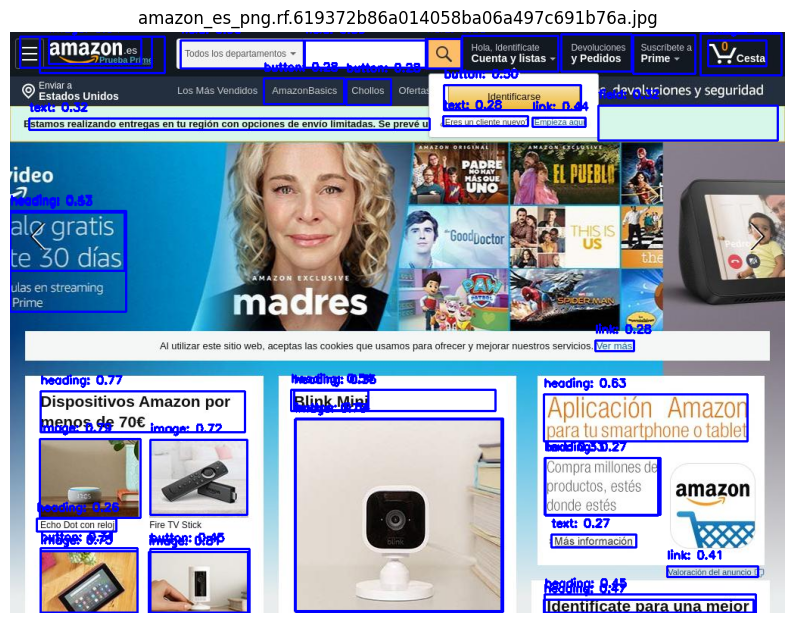


image 1/1 /content/Website-Screenshots-1/test/images/amazon_es_png.rf.Fii3VUhoRgEjCp6YyTw0.jpg: 480x608 12 buttons, 4 fields, 10 headings, 7 images, 3 links, 4 texts, 33.8ms
Speed: 4.0ms preprocess, 33.8ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 608)


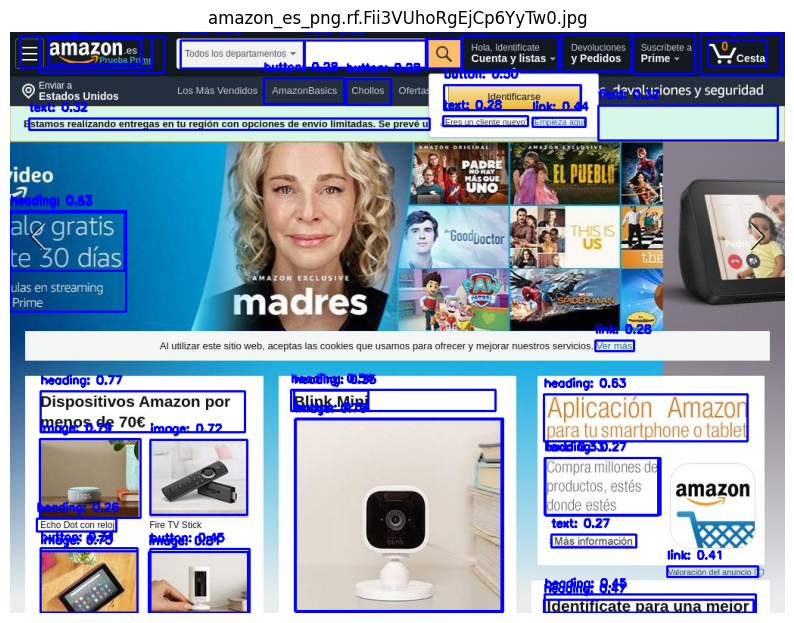

In [62]:
for image_file in test_image_files:
    image_path = os.path.join(test_images_path, image_file)

    # Make predictions
    reslist2 = model2.predict(image_path)

    # Visualize predictions
    for res in reslist2[:10]:
        img = res.orig_img  # Original image with predictions
        for box in res.boxes:
            x1, y1, x2, y2 = box.xyxy.cpu().numpy().astype(int)[0]
            cls = int(box.cls[0].cpu().numpy())  # Class index
            conf = box.conf[0].cpu().numpy()  # Confidence score

            # Draw bounding boxes
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            label = f"{model.names[cls]}: {conf:.2f}"
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        # Show the image with predictions
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(image_file)
        plt.show()


In [63]:
# Evaluate the model on the validation set
val_res2 = model2.val(data='/content/Website-Screenshots-1/data.yaml')

Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/Website-Screenshots-1/valid/labels.cache... 482 images, 0 backgrounds, 0 corrupt: 100%|██████████| 482/482 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/bandsintown_com_png.rf.I19VlDFncZ0RifJhmfEU.jpg: 4 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/bandsintown_com_png.rf.b8462344187a5cdffe24d70019fabd0a.jpg: 4 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/deondernemer_nl_png.rf.c00a7c65fab4356b887dea5c9e96e8f3.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/deondernemer_nl_png.rf.mVLu7hIaZ8VUCwbhSF6c.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/flickr_com_png.rf.27963e0183770e78d58a8b78dc41715e.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/flickr_com_png.rf.IKOHXY9vM9t5eOz75BGX.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/Website-Screenshots-1/valid/images/foxnews_com_png.rf.10605c226e8ff71fd5510b806e5584b5.jpg: 2 duplicate labels removed
val: WARNING ⚠


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:20<00:00,  1.50it/s]


                   all        482      20888      0.316      0.309      0.284      0.194
                button        454       6354      0.597      0.357      0.421      0.274
                 field        242        366      0.306      0.661      0.531      0.407
               heading        428       1508      0.297      0.581      0.409      0.268
                iframe        102        158          0          0          0          0
                 image        468       3766      0.545      0.375      0.389      0.283
                 label         20         34          0          0          0          0
                  link        380       2654      0.366      0.315      0.295       0.19
                  text        468       6048       0.42      0.183      0.228      0.126
Speed: 0.3ms preprocess, 9.7ms inference, 0.0ms loss, 16.1ms postprocess per image
Results saved to runs/detect/train32


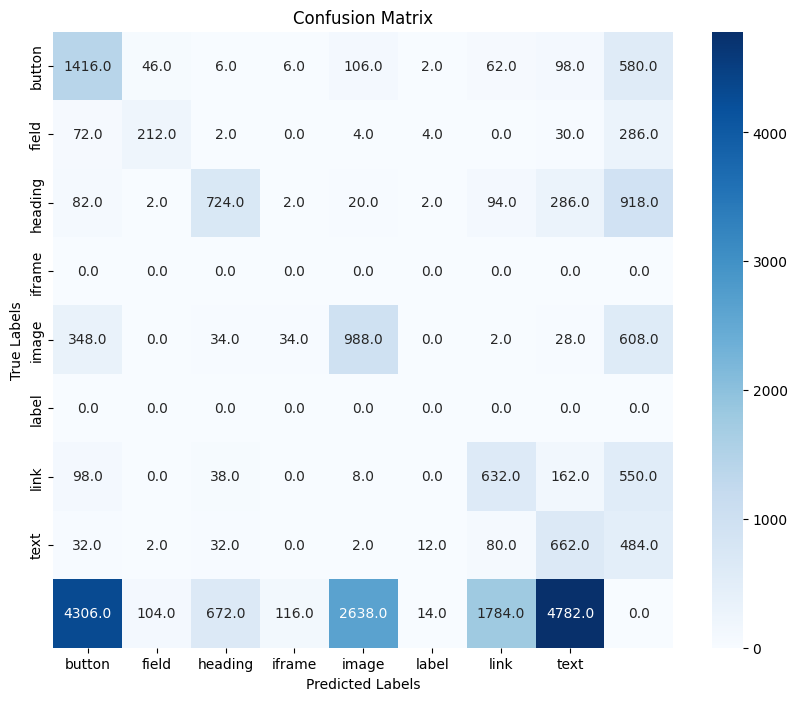

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Access the confusion matrix from the validation results
conf_matrix = val_res2.confusion_matrix.matrix

# Class names (replace these with actual class names if needed)
class_names = ['button', 'field', 'heading', 'iframe', 'image', 'label', 'link', 'text']

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt=".1f", cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


In [66]:
import numpy as np
import pandas as pd  # Import pandas for table creation

# Access the confusion matrix
conf_matrix = val_res2.confusion_matrix.matrix

# Initialize lists to store precision, recall, and F1-score
precisions = []
recalls = []
f1_scores = []

# Class names (replace with actual class names if needed)
class_names = ['button', 'field', 'heading', 'iframe', 'image', 'label', 'link', 'text']

# Calculate metrics for each class
for i in range(len(class_names)):
    tp = conf_matrix[i, i]  # True positives
    fp = conf_matrix[:, i].sum() - tp  # False positives
    fn = conf_matrix[i, :].sum() - tp  # False negatives

    # Precision and recall calculations
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)

# Create a DataFrame to hold the results
results_df = pd.DataFrame({
    'Class': class_names,
    'Precision': precisions,
    'Recall': recalls,
    'F1-Score': f1_scores
})

# Set the Class column as the index
results_df.set_index('Class', inplace=True)

# Print the results in table format
print(results_df)


         Precision    Recall  F1-Score
Class                                 
button    0.222852  0.609819  0.326418
field     0.579235  0.347541  0.434426
heading   0.480106  0.339906  0.398021
iframe    0.000000  0.000000  0.000000
image     0.262347  0.483839  0.340220
label     0.000000  0.000000  0.000000
link      0.238131  0.424731  0.305167
text      0.109458  0.506891  0.180038
